# Recommended Workflow before Running this Notebook

1. Download uncalibrated images from MAST
2. Run the JWST pipelines: {filter}_cal.ipynb
3. Using the padded images from the calibration step, run Winnie to get HPFRDI and deconvolved images: {filter}_deconv.ipynb
4. Save the HPFRDI and deconvolved images as fits files: F187N.fits, F200W.fits, F356W.fits, F444W.fits

# F200W


### HPFRDI Image

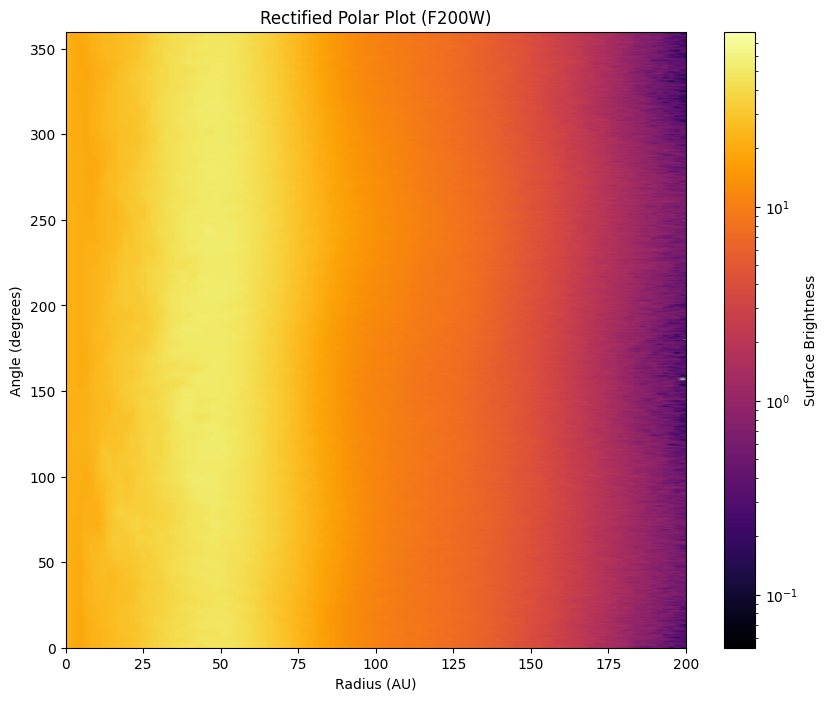

In [1]:
# Rectified Polar Plot
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F200W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,1]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.1 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

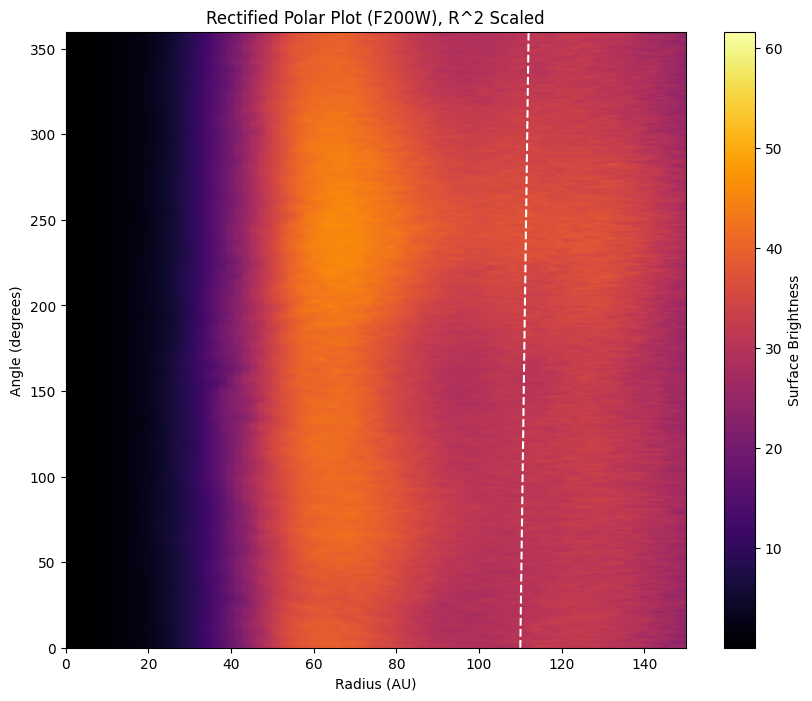

In [2]:
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

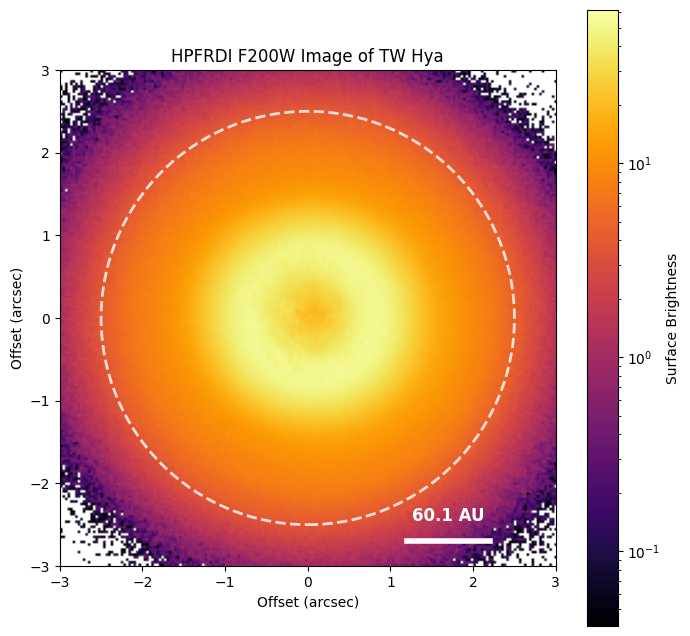

In [3]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'HPFRDI {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()


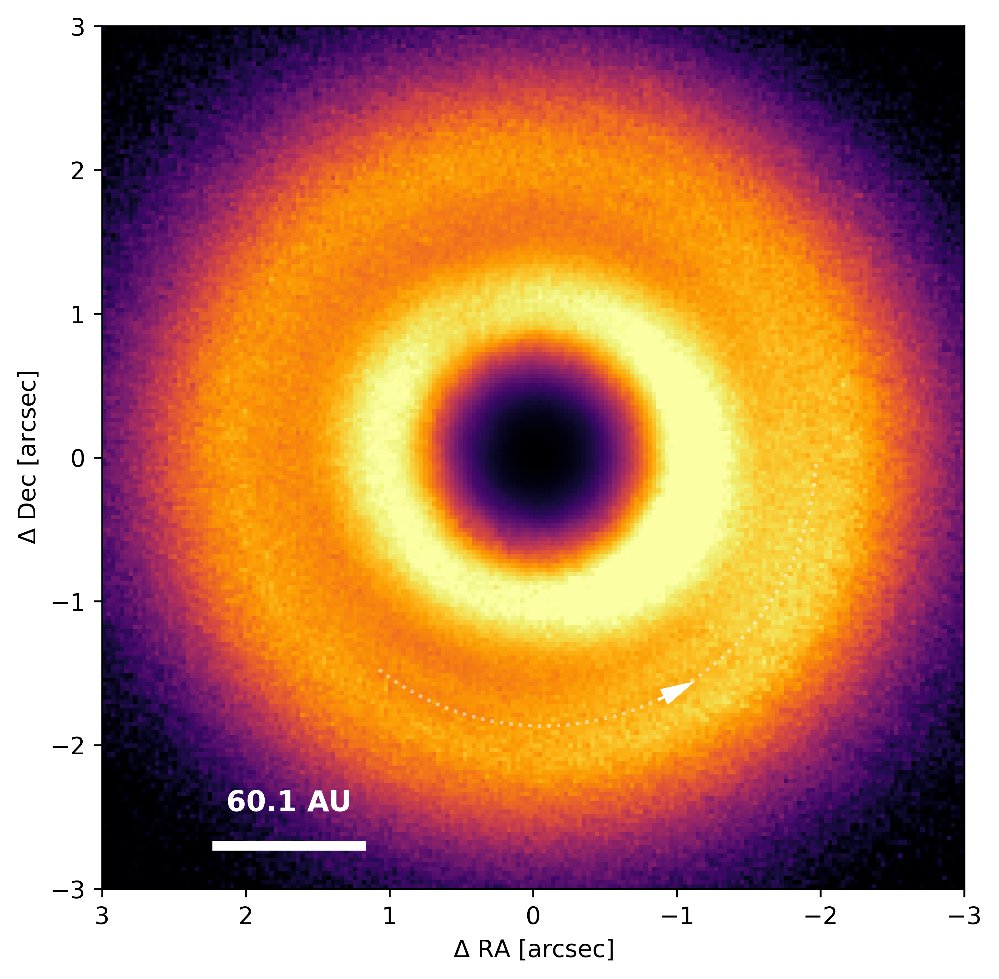

In [4]:
# --- Plot Original Image ---
plt.figure(figsize=(6.5, 6.5), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0, vmin=0.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(-x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
plt.arrow( -r_spiral[50]*np.cos(theta[50]), r_spiral[50]*np.sin(theta[50]),
           -0.5*(r_spiral[51]-r_spiral[50])*np.cos(theta[50])-r_spiral[50]*(-np.sin(theta[50])*(theta[51]-theta[50])),
           0.5*(r_spiral[51]-r_spiral[50])*np.sin(theta[50])+r_spiral[50]*(np.cos(theta[50])*(theta[51]-theta[50])),
           head_width=0.1, head_length=0.2, fc='white', ec='white')
           
# Add vertical (to the spiral) lines at the start and end of the spiral
'''
plt.plot([r_spiral[0]*np.cos(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.cos(theta[0]) + 0.1/2**0.5],
         [r_spiral[0]*np.sin(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.sin(theta[0]) + 0.1/2**0.5],
         color='white', linestyle='-', alpha=1)
plt.plot([r_spiral[-1]*np.cos(theta[-1]) + 0.1, r_spiral[-1]*np.cos(theta[-1]) - 0.1],
         [r_spiral[-1]*np.sin(theta[-1]), r_spiral[-1]*np.sin(theta[-1])],
         color='white', linestyle='-')
'''
# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

#plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.savefig('original_image.png', dpi=600, bbox_inches='tight')
plt.show()

Radius 39 au: Max at 186.8 deg, Min at 28.5 deg
Radius 53 au: Max at 234.3 deg, Min at 31.0 deg
Radius 88 au: Max at 247.8 deg, Min at 24.5 deg
Radius 141 au: Max at 253.4 deg, Min at 350.0 deg


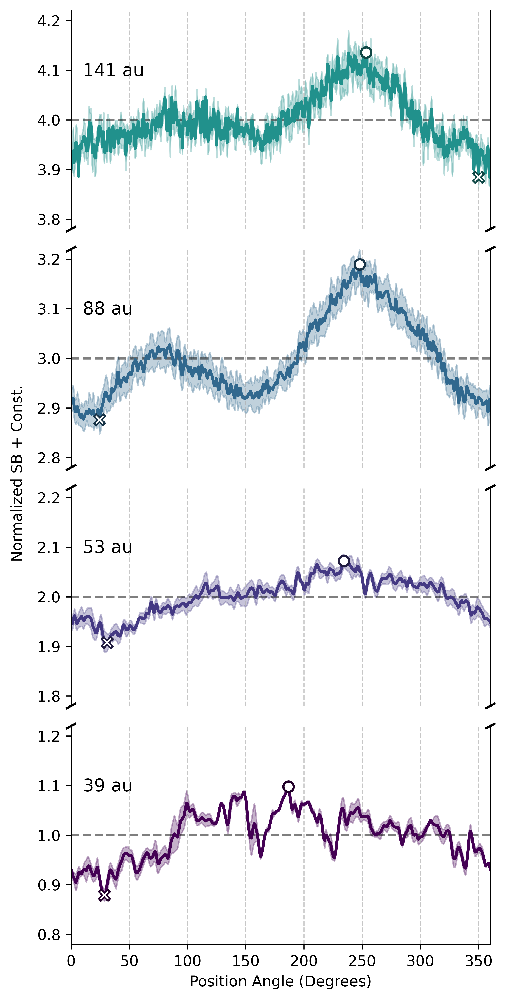

In [5]:
# Define the y-ranges you want to display
y_ranges = [(0.78, 1.22), (1.78, 2.22), (2.78, 3.22), (3.78, 4.22)]

# Create a figure with one column and a number of rows equal to your ranges
# We use sharex=True so all plots share the same x-axis and ticks
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)

# Remove the vertical space between the subplots
fig.subplots_adjust(hspace=0)

# Define the width of the annulus for averaging (in pixels)
annulus_width = 3
annulus_half_width = annulus_width // 2

# Radii of interest in au
radii_au = np.array([39, 53, 88, 141])

# Convert au to pixels
radii_pix_interest = (radii_au / dist) / pixel_scale

# Find the closest index in our radii_pix array
radii_indices = [np.argmin(np.abs(radii_pix - r)) for r in radii_pix_interest]

# Angles in degrees
angles_deg = np.rad2deg(thetas)

# Create a list of colors for the plots
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# --- Plot each profile on its corresponding subplot ---
# We reverse the axes so that the plot with the smallest y-values is at the bottom
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_idx = radii_indices[i]
    
    # Extract the brightness profile over an annulus
    start_idx = max(0, radius_idx - annulus_half_width)
    end_idx = min(polar_image.shape[1], radius_idx + annulus_half_width + 1)
    
    annulus_data = polar_image[:, start_idx:end_idx]
    
    profile = np.nanmean(annulus_data, axis=1)
    std_dev = np.nanstd(annulus_data, axis=1)
    
    pixel_number = annulus_data.shape[1]
    if pixel_number == 0: continue

    yerr = std_dev / np.sqrt(pixel_number)
    
    profile_mean = np.nanmean(profile)
    if np.isnan(profile_mean) or profile_mean == 0: continue

    # Add offset to separate the plots
    offset = i
    
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    color = colors[i]
    
    # Set the y-limits for this specific subplot
    ax.set_ylim(y_ranges[i])

    # Add dashed line at the mean level
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    
    ax.fill_between(angles_deg, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_deg, normalized_profile, '-', color=color, linewidth=2)
    
    # Add text annotation for the radius
    # Adjust y-position to be relative to the new ylim
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.0))
    
    # Mark the maximum and minimum points
    max_idx = np.nanargmax(normalized_profile)
    min_idx = np.nanargmin(normalized_profile)
    darker_color = np.copy(color)
    darker_color[:3] = darker_color[:3] * 0.5  # Darken the color for the marker edge
    ax.plot(angles_deg[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    print(f'Radius {radius_au} au: Max at {angles_deg[max_idx]:.1f} deg, Min at {angles_deg[min_idx]:.1f} deg')

    # --- Add break marks and clean up spines ---
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False) # Hide x-ticks
    
    # Add diagonal break marks to the y-axis spines
    d = .01 # size of the break marks
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes)-1: # Add marks to the top of all but the top-most plot
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: # Add marks to the bottom of all but the bottom-most plot
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final plot adjustments ---
# Only show the bottom spine and label for the last (bottom) plot
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

# Add a single y-label for the entire figure
fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')

# Optional: Add a title to the entire figure
# fig.suptitle(f'Azimuthal Surface Brightness Distribution with Error Shadow ({filter_name})', y=0.95)

plt.tight_layout(rect=[0.08, 0, 1, 0.95]) # Adjust layout to make space for labels
plt.savefig('azimuthal_distribution_broken_axis.png', dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_2775916/1387849959.py:14: RuntimeWarning: Mean of empty slice
  radial_profile = np.nanmean(polar_image, axis=0)
/tmp/ipykernel_2775916/1387849959.py:15: RuntimeWarning: Mean of empty slice
  radial_profile_r2 = np.nanmean(polar_image_r2_scaled, axis=0)


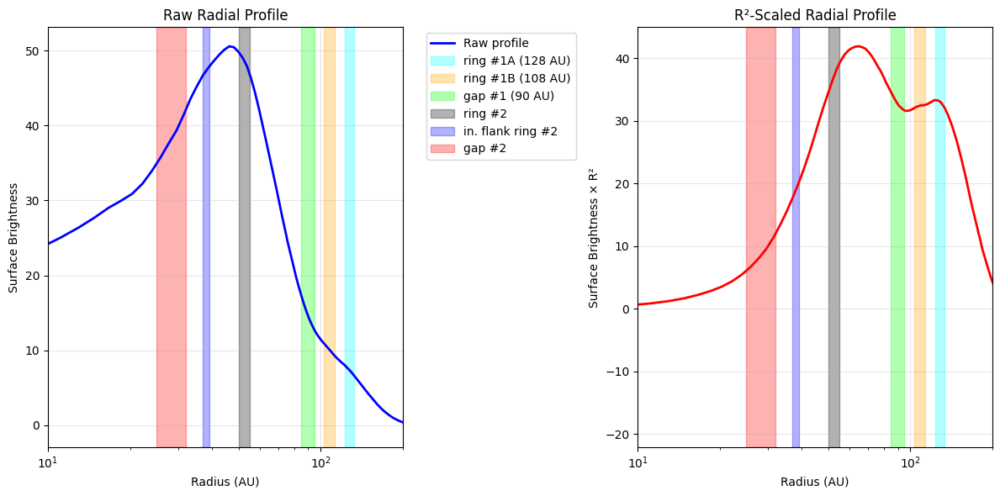


Numerical comparison of ring #1 vs gap #1:
ring #1A (128 AU) (123-133 AU):
  Raw mean: 7.31e+00
  R² mean: 3.29e+01
  Radius range in pixels: 66 to 72
ring #1B (108 AU) (103-113 AU):
  Raw mean: 9.99e+00
  R² mean: 3.24e+01
  Radius range in pixels: 56 to 61
gap #1 (90 AU) (85-95 AU):
  Raw mean: 1.48e+01
  R² mean: 3.29e+01
  Radius range in pixels: 46 to 51
ring #2 (50-55 AU):
  Raw mean: 4.83e+01
  R² mean: 3.72e+01
  Radius range in pixels: 27 to 30
in. flank ring #2 (37-39 AU):
  Raw mean: 4.72e+01
  R² mean: 1.89e+01
  Radius range in pixels: 20 to 21
gap #2 (25-32 AU):
  Raw mean: 3.76e+01
  R² mean: 8.22e+00
  Radius range in pixels: 13 to 17


In [6]:
# --- Diagnostic: Check Radial Brightness Profile ---
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)
        
# This cell helps identify why ring #1 and gap #1 show similar brightness

plt.figure(figsize=(12, 6))

# Calculate radial profile by averaging over all angles
radial_profile = np.nanmean(polar_image, axis=0)
radial_profile_r2 = np.nanmean(polar_image_r2_scaled, axis=0)
radii_au = radii_pix * pixel_scale * dist

# Plot both raw and R²-scaled profiles
ax1 = plt.subplot(1, 2, 1)
plt.plot(radii_au, radial_profile, 'b-', linewidth=2, label='Raw profile')
plt.xlabel('Radius (AU)')
plt.ylabel('Surface Brightness')
plt.title('Raw Radial Profile')
plt.xlim(10, 200)
plt.xscale('log')
plt.grid(True, alpha=0.3)

# Mark the regions we're analyzing
regions_check = {
    'ring #1A (128 AU)': (123, 133),
    'ring #1B (108 AU)': (103, 113),
    'gap #1 (90 AU)': (85, 95),
    'ring #2': (50, 55),
    'in. flank ring #2': (37, 39),
    'gap #2': (25, 32)
}

colors = ['cyan', 'orange', 'lime', 'black', 'blue', 'red']
for i, (name, (r_in, r_out)) in enumerate(regions_check.items()):
    plt.axvspan(r_in, r_out, alpha=0.3, color=colors[i], label=name)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Plot R²-scaled profile
ax2 = plt.subplot(1, 2, 2)
plt.plot(radii_au, radial_profile_r2, 'r-', linewidth=2, label='R² scaled profile')
plt.xlabel('Radius (AU)')
plt.ylabel('Surface Brightness × R²')
plt.title('R²-Scaled Radial Profile')
plt.xlim(10, 200)
plt.xscale('log')
plt.grid(True, alpha=0.3)

# Mark the same regions
for i, (name, (r_in, r_out)) in enumerate(regions_check.items()):
    plt.axvspan(r_in, r_out, alpha=0.3, color=colors[i])

plt.tight_layout()
plt.show()

# Print numerical values for the problematic regions
print("\nNumerical comparison of ring #1 vs gap #1:")
for name, (r_in, r_out) in regions_check.items():
    # Find pixel indices
    r_in_pix = (r_in / dist) / pixel_scale
    r_out_pix = (r_out / dist) / pixel_scale
    idx_in = np.argmin(np.abs(radii_pix - r_in_pix))
    idx_out = np.argmin(np.abs(radii_pix - r_out_pix))
    
    # Calculate mean brightness in this range
    raw_mean = np.nanmean(radial_profile[idx_in:idx_out+1])
    r2_mean = np.nanmean(radial_profile_r2[idx_in:idx_out+1])
    
    print(f"{name} ({r_in}-{r_out} AU):")
    print(f"  Raw mean: {raw_mean:.2e}")
    print(f"  R² mean: {r2_mean:.2e}")
    print(f"  Radius range in pixels: {idx_in} to {idx_out}")

ring #1A (128 AU) (123-133 AU): Mean brightness = 3.29e+01
  - Radial range in pixels: 66 to 72
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 7.31e+00
---
ring #1B (108 AU) (103-113 AU): Mean brightness = 3.24e+01
  - Radial range in pixels: 56 to 61
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 9.99e+00
---
gap #1 (90 AU) (85-95 AU): Mean brightness = 3.29e+01
  - Radial range in pixels: 46 to 51
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 1.48e+01
---
ring #2 (50-55 AU): Mean brightness = 3.72e+01
  - Radial range in pixels: 27 to 30
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 4.83e+01
---
in. flank ring #2 (37-39 AU): Mean brightness = 1.89e+01
  - Radial range in pixels: 20 to 21
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 4.72e+01
---
gap #2 (25-32 AU): Mean brightness = 8.22e+00
  - Radial range in pixels: 13 to 17
  - Radial 

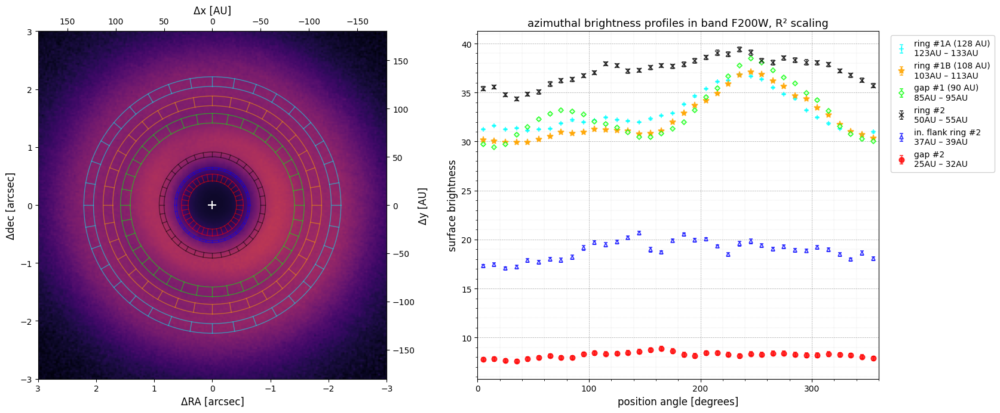

In [7]:
# --- Reproduce Figure 5 from the paper ---

# --- Setup ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8), dpi=100)
plt.subplots_adjust(wspace=0.3)
num_spokes = 36
colors = ['cyan', 'orange', 'lime', 'black', 'blue', 'red']

# --- Left Plot: Image with Overlays ---

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

ax1.imshow(cropped_image*distances**2, origin='lower', cmap='inferno', 
           vmax=100,
           extent=extent)

# Define regions from the right plot's legend in the paper
# Mark the regions we're analyzing with regions_check
markers = ['+', '*', 'D', 'x', '^', 'o']
size = [6, 8, 4, 6, 5, 6]  # Sizes for each marker
regions = {}
for i, (name, (r_in, r_out)) in enumerate(regions_check.items()):
    regions[name] = {
        'range': (r_in, r_out),
        'color': colors[i],
        'marker': markers[i],
        'size': size[i]
    }

# Draw the exact regions being analyzed in the right panel on the left image
# This ensures the overlays match the actual data being plotted
for name, props in regions.items():
    r_inner_au, r_outer_au = props['range']
    r_inner_arcsec = r_inner_au / dist
    r_outer_arcsec = r_outer_au / dist
    color = props['color']
    
    # Draw annulus boundaries for each region
    ring_inner = plt.Circle((0, 0), r_inner_arcsec, fill=False, color=color, 
                           linewidth=1, alpha=0.5, linestyle='-')
    ring_outer = plt.Circle((0, 0), r_outer_arcsec, fill=False, color=color, 
                           linewidth=1, alpha=0.5, linestyle='-')
    ax1.add_patch(ring_inner)
    ax1.add_patch(ring_outer)

    # Draw radial spokes ('spider') to show analysis zone
    for j in range(num_spokes):
        theta_spoke = 2 * np.pi * j / num_spokes
        x_inner = r_inner_arcsec * np.cos(theta_spoke)
        y_inner = r_inner_arcsec * np.sin(theta_spoke)
        x_outer = r_outer_arcsec * np.cos(theta_spoke)
        y_outer = r_outer_arcsec * np.sin(theta_spoke)
        ax1.plot([x_inner, x_outer], [y_inner, y_outer], color=color, linewidth=1, alpha=0.5)

    '''
    # Add a text label for each region
    short_label = name.replace(' (80 AU)', '').replace('in. flank ', '')
    mid_radius = (r_inner_arcsec + r_outer_arcsec) / 2
    angle_label = np.pi / 4  # 45 degrees
    label_x = mid_radius * np.cos(angle_label)
    label_y = mid_radius * np.sin(angle_label)
    ax1.text(label_x, label_y, short_label, color=color, fontsize=8, 
             fontweight='bold', ha='center', va='center',
             bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))
    '''

# Add central star marker with a cross
ax1.plot(0, 0, marker='+', markersize=10, color='white', markeredgewidth=1.5, label='central star')

# Set up axes for the left plot
ax1.set_xlabel('ΔRA [arcsec]', fontsize=12)
ax1.set_ylabel('Δdec [arcsec]', fontsize=12)
ax1.set_xlim(extent[0], extent[1])
ax1.set_ylim(extent[2], extent[3])
ax1.set_aspect('equal', 'box')

# Add secondary axes in AU
secax_x = ax1.secondary_xaxis('top', functions=(lambda x: x * dist, lambda x: x / dist))
secax_x.set_xlabel('Δx [AU]', fontsize=12)
secax_y = ax1.secondary_yaxis('right', functions=(lambda y: y * dist, lambda y: y / dist))
secax_y.set_ylabel('Δy [AU]', fontsize=12)

# --- Right Plot: Azimuthal Brightness Profiles ----
# Create angle array
angles_deg = np.rad2deg(thetas)

# Plot each profile with proper styling
for name, props in list(regions.items()):
    r_inner_au, r_outer_au = props['range']
    
    # Convert AU to pixel radius
    r_inner_pix = (r_inner_au / dist) / pixel_scale
    r_outer_pix = (r_outer_au / dist) / pixel_scale
    
    # Find indices in radii_pix array
    idx_inner = np.argmin(np.abs(radii_pix - r_inner_pix))
    idx_outer = np.argmin(np.abs(radii_pix - r_outer_pix))
    
    if idx_inner >= idx_outer:
        continue

    # Extract annulus data
    annulus_data = polar_image_r2_scaled[:, idx_inner:idx_outer+1]
    
    # Build angular sections based on num_spokes
    angles_edges = np.linspace(0, 2 * np.pi, num_spokes + 1)
    angles_mid = (angles_edges[:-1] + angles_edges[1:]) / 2
    angles_deg_mid = np.rad2deg(angles_mid)

    # Compute section-wise mean and error
    profile = []
    yerr = []
    for j in range(num_spokes):
        # Mask angular slice
        mask_ang = (thetas >= angles_edges[j]) & (thetas < angles_edges[j+1])
        # Extract data for this segment and radial range
        seg_data = annulus_data[mask_ang, :].ravel()
        seg_data = seg_data[~np.isnan(seg_data)]
        if seg_data.size > 0:
            m = np.mean(seg_data)
            e = np.std(seg_data) / np.sqrt(seg_data.size)
        else:
            m, e = np.nan, np.nan
        profile.append(m)
        yerr.append(e)
    profile = np.array(profile)
    yerr = np.array(yerr)

    # Plot with segment-wise error bars
    ax2.errorbar(angles_deg_mid, profile, yerr=yerr,
                 fmt=props['marker'], markersize=props['size'], capsize=2,
                 color=props['color'], ecolor=props['color'], elinewidth=1,
                 markeredgecolor=props['color'],
                 markerfacecolor='white' if props['marker'] in ['D','s','^'] else props['color'],
                 label=f"{name}\n{r_inner_au}AU – {r_outer_au}AU", alpha=0.8,
                 linestyle='None', markeredgewidth=1.2)
    
    # Debug: Print brightness values for comparison
    mean_brightness = np.nanmean(profile)
    print(f"{name} ({r_inner_au}-{r_outer_au} AU): Mean brightness = {mean_brightness:.2e}")
    print(f"  - Radial range in pixels: {idx_inner} to {idx_outer}")
    print(f"  - Radial range in arcsec: {r_inner_arcsec:.3f} to {r_outer_arcsec:.3f}")
    
    # Also check the raw (unscaled) data for comparison
    annulus_data_raw = polar_image[:, idx_inner:idx_outer+1]
    raw_mean = np.nanmean(annulus_data_raw)
    print(f"  - Raw (no R²) mean brightness: {raw_mean:.2e}")
    print("---")

# Set up axes and styling to match the paper
ax2.set_title(f'azimuthal brightness profiles in band {filter_name}, R² scaling', fontsize=13)
ax2.set_xlabel('position angle [degrees]', fontsize=12)
ax2.set_ylabel('surface brightness', fontsize=12)
ax2.set_xlim(0, 360)
ax2.set_xticks([0, 100, 200, 300])
ax2.minorticks_on()
ax2.grid(which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)
ax2.grid(which='minor', linestyle=':', linewidth=0.3, color='gray', alpha=0.5)

# Create legend positioned to not overlap with data
legend = ax2.legend(bbox_to_anchor=(1.02, 1), loc='upper left', 
                   fontsize=10, handlelength=1.5, frameon=True, 
                   facecolor='white', framealpha=0.9, borderpad=0.5)

# --- Final Figure Adjustments ---

# Add figure caption
#fig.suptitle(f'Figure 1. Azimuthal intensity profiles in the {filter_name}-band, radially integrated over the gap and ring regions as indicated in the image.\nA distance of {dist:.1f} pc has been assumed.', 
#            fontsize=11, y=0.02, ha='center')

plt.tight_layout(rect=[0, 0.08, 0.85, 0.96])
plt.savefig('azimuthal.png', dpi=300, bbox_inches='tight')
plt.show()


### Deconvolved Image

Fitted line: y = 0.5469$x^2$ + 0.2025x + -0.4444, $R^2$ = 0.98
Coefficients: 0.54685187875727, 0.20253219681092, -0.44441747070328


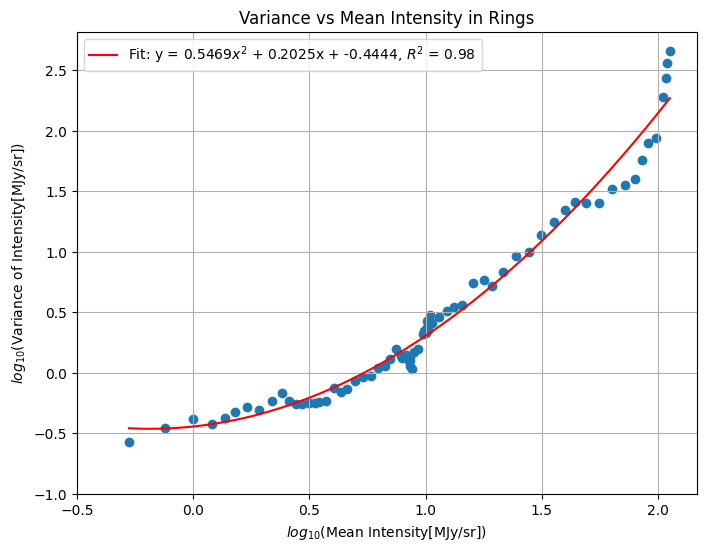

In [8]:
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np

# Load the F200W and F444W FITS files
fits_files = ['source/F200W.fits', 'source/F444W.fits']
hduls = [fits.open(fits_file) for fits_file in fits_files]
data = [hdul[0].data for hdul in hduls]
images = [d[:,:,0] for d in data]
image_f200w = images[0]

# make a ring clipping mask
r_in = 22  # inner radius in pixels
r_out = 97  # outer radius in pixels
x_center, y_center = 324.5, 324.5  # center of the ring in pixels
rings = [[] for _ in range(r_in, r_out)]
for x,y in np.ndindex(image_f200w.shape):
    r = np.sqrt((x-x_center)**2 + (y-y_center)**2)
    if r_in <= r <= r_out:
        #print(r, int(r)-r_in)
        rings[int(r)-r_in].append(image_f200w[x,y])

# calculate the mean value and var of each ring
ring_means = [np.mean(ring) for ring in rings]
ring_vars = [np.var(ring, ddof=1) for ring in rings]
ring_means_log = np.log10(ring_means)
ring_vars_log = np.log10(ring_vars)

# Fit a line to the data
coefficients = np.polyfit(ring_means_log, ring_vars_log, 2)
polynomial = np.poly1d(coefficients)
R_squared = 1 - (np.sum((ring_vars_log - polynomial(ring_means_log))**2) / np.sum((ring_vars_log - np.mean(ring_vars_log))**2))
print(f"Fitted line: y = {coefficients[0]:.4f}$x^2$ + {coefficients[1]:.4f}x + {coefficients[2]:.4f}, $R^2$ = {R_squared:.2f}")
# print the coefficients in high precision
print(f"Coefficients: {coefficients[0]:.14f}, {coefficients[1]:.14f}, {coefficients[2]:.14f}")

# Create a scatter plot of var vs mean
plt.figure(figsize=(8, 6))
plt.scatter(ring_means_log, ring_vars_log)
# Plot the fitted line
x_fit = np.linspace(min(ring_means_log), max(ring_means_log), 100)
y_fit = polynomial(x_fit)
plt.plot(x_fit, y_fit, color='red', label=f'Fit: y = {coefficients[0]:.4f}$x^2$ + {coefficients[1]:.4f}x + {coefficients[2]:.4f}, $R^2$ = {R_squared:.2f}')
plt.legend()
plt.xlabel(f'$log_{{10}}$(Mean Intensity[MJy/sr])')
plt.ylabel(f'$log_{{10}}$(Variance of Intensity[MJy/sr])')
plt.title('Variance vs Mean Intensity in Rings')
plt.grid(True)
plt.xlim(-0.5,)
plt.ylim(-1,)
plt.show()

Cropped image shape: (196, 196) Cropped image shape: (96, 96)
pixel_scales: [0.03068494, 0.062424185]
total brightness: 920186.4
total brightness: 35280.92
resized_image brightness: 920308.44
cropped_images shape: (96, 96)


/tmp/ipykernel_2775916/2503222258.py:58: RuntimeWarning: divide by zero encountered in divide
  plt.imshow(-100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32), vmin=-3, vmax=3, cmap='RdBu_r', extent=extent, origin='lower')
/tmp/ipykernel_2775916/2503222258.py:58: RuntimeWarning: overflow encountered in divide
  plt.imshow(-100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32), vmin=-3, vmax=3, cmap='RdBu_r', extent=extent, origin='lower')
/tmp/ipykernel_2775916/2503222258.py:58: RuntimeWarning: invalid value encountered in log10
  plt.imshow(-100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32), vmin=-3, vmax=3, cmap='RdBu_r', extent=extent, origin='lower')


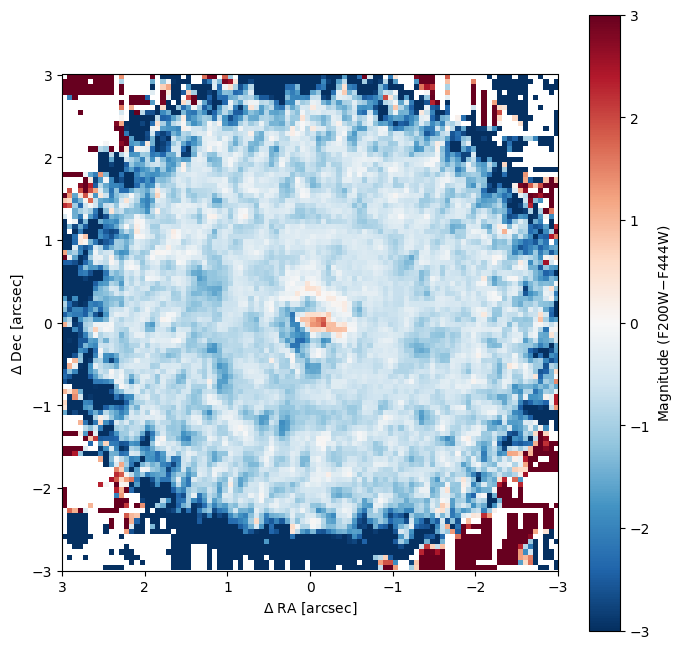

In [9]:
# Color difference plot F200W-F444W, TW Hya

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from skimage.transform import resize

# Load the F200W and F444W FITS files
fits_files = ['source/F200W.fits', 'source/F444W.fits']
hduls = [fits.open(fits_file) for fits_file in fits_files]
data = [hdul[0].data for hdul in hduls]
images = [d[:,:,0] for d in data]

# Read headers
headers = [hdul[0].header for hdul in hduls]

# parameters
pixel_scales = [header['PIXSCALE'] for header in headers]  # in arcsec/pixel
dist = 60.1 # distance to TW Hya in pc

# Image dimensions and center
ny, nx = images[0].shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = [extent_arcsec / ps for ps in pixel_scales]
half_extent_pix = [ep / 2 for ep in extent_pixels]

# Create a cropped view centered on the image
x_starts = [int(center_x - hep) for hep in half_extent_pix]
x_ends = [int(center_x + hep) for hep in half_extent_pix]
y_starts = [int(center_y - hep) for hep in half_extent_pix]
y_ends = [int(center_y + hep) for hep in half_extent_pix]

cropped_images = []
for y_start, y_end, x_start, x_end, i in zip(y_starts, y_ends, x_starts, x_ends, range(len(images))):
    cropped_image = images[i][y_start:y_end, x_start:x_end]
    cropped_images.append(cropped_image)

print("Cropped image shape:", cropped_images[0].shape, "Cropped image shape:", cropped_images[1].shape)
print("pixel_scales:", pixel_scales)

resized_image = resize(cropped_images[0], cropped_images[1].shape, order=3, mode='reflect', anti_aliasing=False)
for i in range(len(cropped_images)):
    print("total brightness:", np.sum(cropped_images[i]))
    
print("resized_image brightness:", np.sum(resized_image)*196*196/96/96)
print("cropped_images shape:", resized_image.shape)

plt.imshow(-100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32), vmin=-3, vmax=3, cmap='RdBu_r', extent=extent, origin='lower')
plt.colorbar(label=r'Magnitude (F200W$-$F444W)')
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.show()

wh_min, wh_max (arcsec): 4.41863136, 5.952878360000001
x_offset, y_offset: 0.02086575920000021 0.002147945799999791


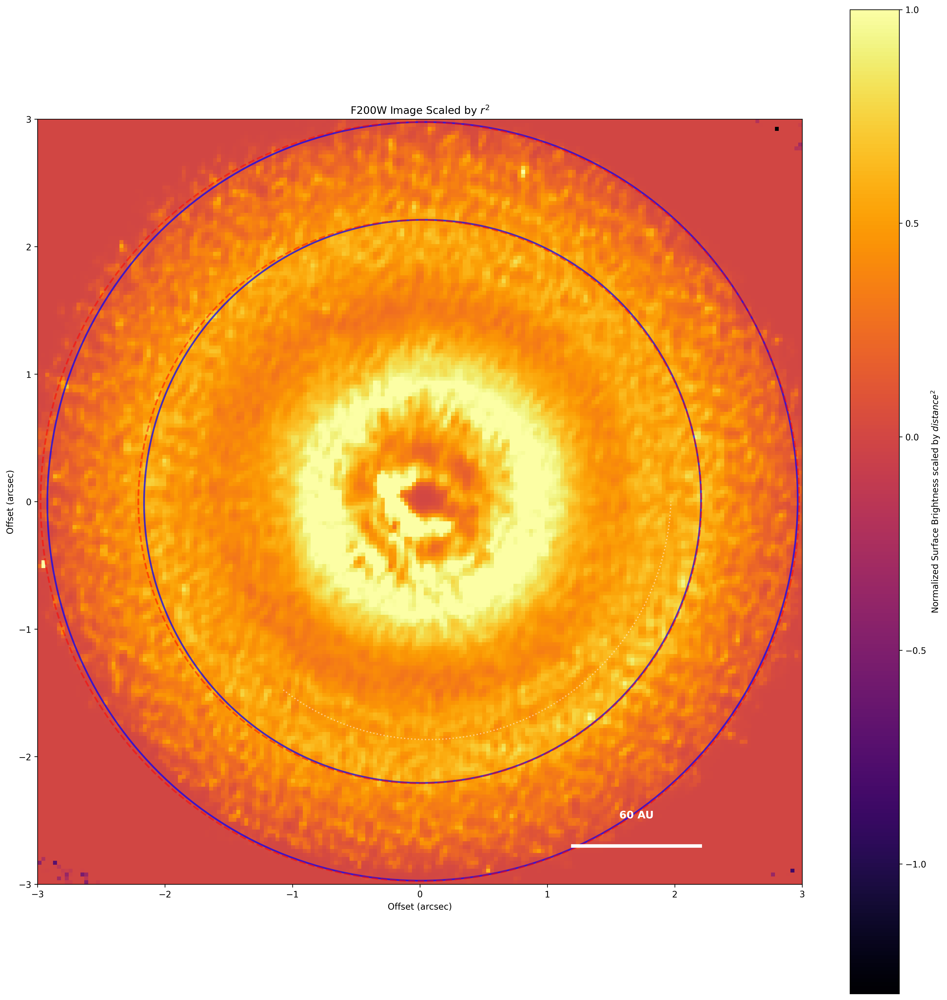

In [10]:

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import numpy as np

# Load the F200W and F444W FITS files
fits_files = ['source/F200W.fits', 'source/F444W.fits']
hduls = [fits.open(fits_file) for fits_file in fits_files]
data = [hdul[0].data for hdul in hduls]
images = [d[:,:,0] for d in data]

# Create a figure with a single subplot
fig, ax = plt.subplots(1, 1, figsize=(16, 16), dpi=300)

# --- Scaled Original Image Plot ---
# Note: some variables are defined in other cells, like 'images', 'pixel_scales', 'dist'

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 6 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Use images[0] for consistency (F200W)
image_f200w = images[0]
pixel_scale_f200w = pixel_scales[0]
ny_f200w, nx_f200w = image_f200w.shape
center_y_f200w, center_x_f200w = (ny_f200w - 1) / 2.0, (nx_f200w - 1) / 2.0

# Calculate the pixel range corresponding to the extent
extent_pixels_f200w = extent_arcsec / pixel_scale_f200w
half_extent_pix_f200w = extent_pixels_f200w / 2

# Create a cropped view centered on the image
x_start_f200w = int(center_x_f200w - half_extent_pix_f200w)
x_end_f200w = int(center_x_f200w + half_extent_pix_f200w)
y_start_f200w = int(center_y_f200w - half_extent_pix_f200w)
y_end_f200w = int(center_y_f200w + half_extent_pix_f200w)

# Ensure we don't go outside image bounds
x_start_f200w = max(0, x_start_f200w)
x_end_f200w = min(nx_f200w, x_end_f200w)
y_start_f200w = max(0, y_start_f200w)
y_end_f200w = min(ny_f200w, y_end_f200w)

cropped_image_f200w = image_f200w[y_start_f200w:y_end_f200w, x_start_f200w:x_end_f200w]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image_f200w)
for i in range(cropped_image_f200w.shape[0]):
    for j in range(cropped_image_f200w.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start_f200w + i) - center_y_f200w)**2 + ((x_start_f200w + j) - center_x_f200w)**2) * pixel_scale_f200w

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image_f200w * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
im = ax.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0,
           extent=extent)

# Add 1" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

ax.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
ax.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist:.0f} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# add a ellipse to indicate the inclination and position angle of the disk
wh_min = 2*72.0 * pixel_scale_f200w # arcseconds
wh_max = 2*97.0 * pixel_scale_f200w # arcseconds
print(f"wh_min, wh_max (arcsec): {wh_min}, {wh_max}")

x_offset = (325.18-324.5) * pixel_scale_f200w
y_offset = (324.57-324.5) * pixel_scale_f200w
inclination = 8.65  # degrees
position_angle = 77.25  # degrees
print("x_offset, y_offset:", x_offset, y_offset)

ellipse_blue1 = Ellipse((x_offset, y_offset), width=wh_min, height=wh_min * np.cos(np.radians(inclination)), angle=position_angle,
                  edgecolor='blue', facecolor='none', linestyle='-', linewidth=2, alpha=0.7)
ax.add_patch(ellipse_blue1)

ellipse_blue2 = Ellipse((x_offset, y_offset), width=wh_max, height=wh_max * np.cos(np.radians(inclination)), angle=position_angle,
                  edgecolor='blue', facecolor='none', linestyle='-', linewidth=2, alpha=0.7)
ax.add_patch(ellipse_blue2)

ellipse_red1 = Ellipse((0, 0), width=wh_min, height=wh_min, angle=position_angle,
                  edgecolor='red', facecolor='none', linestyle='--', linewidth=2, alpha=0.5)
ax.add_patch(ellipse_red1)

ellipse_red2 = Ellipse((0, 0), width=wh_max, height=wh_max, angle=position_angle,
                  edgecolor='red', facecolor='none', linestyle='--', linewidth=2, alpha=0.5)
ax.add_patch(ellipse_red2)

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
ax.plot(x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

fig.colorbar(im, ax=ax, label=r'Normalized Surface Brightness scaled by $distance^2$')
ax.set_xlabel('Offset (arcsec)')
ax.set_ylabel('Offset (arcsec)')
ax.set_title('F200W Image Scaled by $r^2$')

plt.tight_layout()
plt.show()

/tmp/ipykernel_2775916/4203036440.py:33: RuntimeWarning: divide by zero encountered in divide
  magnitude_difference = -100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32)
/tmp/ipykernel_2775916/4203036440.py:33: RuntimeWarning: overflow encountered in divide
  magnitude_difference = -100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32)
/tmp/ipykernel_2775916/4203036440.py:33: RuntimeWarning: invalid value encountered in log10
  magnitude_difference = -100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32)


wh_min, wh_max (arcsec): 1.35013736, 5.952878360000001
x_offset, y_offset: 0.01350137359999993 -0.005216439800000488


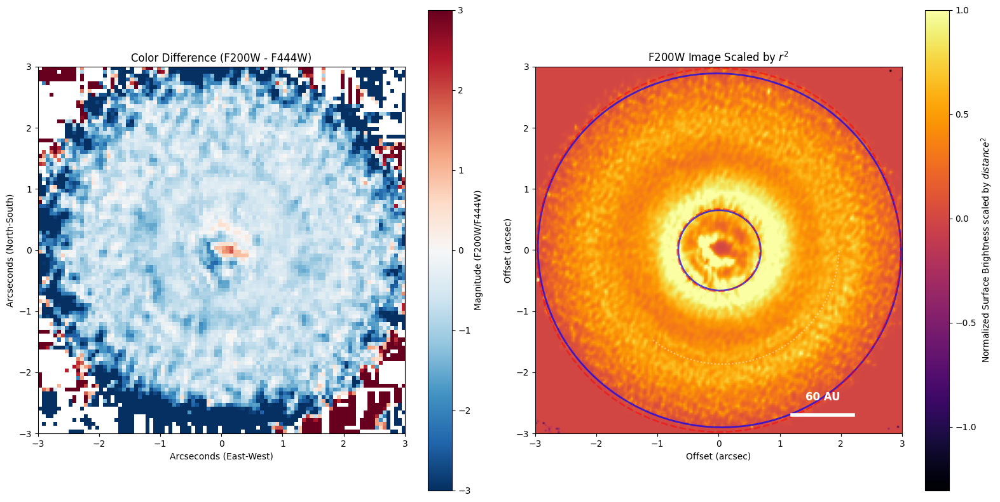

In [11]:
import matplotlib.pyplot as plt
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), dpi=100)

# --- First Plot: Color difference ---
# This part of the code is for the first subplot (ax1)
# Note: some variables are defined in the first cell, like 'images', 'pixel_scales', 'dist', 'center_x', 'center_y'

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = [extent_arcsec / ps for ps in pixel_scales]
half_extent_pix = [ep / 2 for ep in extent_pixels]

# Create a cropped view centered on the image
x_starts = [int(center_x - hep) for hep in half_extent_pix]
x_ends = [int(center_x + hep) for hep in half_extent_pix]
y_starts = [int(center_y - hep) for hep in half_extent_pix]
y_ends = [int(center_y + hep) for hep in half_extent_pix]

# It seems there was a bug in the original code, it was cropping images[0] twice.
# I am correcting it to crop images[0] and images[1]
cropped_images = []
for i, (y_start, y_end, x_start, x_end) in enumerate(zip(y_starts, y_ends, x_starts, x_ends)):
    cropped_image = images[i][y_start:y_end, x_start:x_end]
    cropped_images.append(cropped_image)

resized_image = resize(cropped_images[0], cropped_images[1].shape, order=3, mode='reflect', anti_aliasing=False)

magnitude_difference = -100**(0.2)*np.log10(resized_image/cropped_images[1])+100**(0.2)*np.log10(829.37/227.32)

im1 = ax1.imshow(magnitude_difference, vmin=-3, vmax=3, cmap='RdBu_r', extent=extent, origin='lower')
fig.colorbar(im1, ax=ax1, label='Magnitude (F200W/F444W)')
ax1.set_xlabel('Arcseconds (East-West)')
ax1.set_ylabel('Arcseconds (North-South)')
ax1.set_title('Color Difference (F200W - F444W)')


# --- Second Plot: Scaled Original Image ---
# This part of the code is for the second subplot (ax2)
# It uses 'image' which is defined in cell 3 as data from F200W.fits. Let's use images[0] for consistency.
image_f200w = images[0]
pixel_scale_f200w = pixel_scales[0]
ny_f200w, nx_f200w = image_f200w.shape
center_y_f200w, center_x_f200w = (ny_f200w - 1) / 2.0, (nx_f200w - 1) / 2.0

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels_f200w = extent_arcsec / pixel_scale_f200w
half_extent_pix_f200w = extent_pixels_f200w / 2

# Create a cropped view centered on the image
x_start_f200w = int(center_x_f200w - half_extent_pix_f200w)
x_end_f200w = int(center_x_f200w + half_extent_pix_f200w)
y_start_f200w = int(center_y_f200w - half_extent_pix_f200w)
y_end_f200w = int(center_y_f200w + half_extent_pix_f200w)

# Ensure we don't go outside image bounds
x_start_f200w = max(0, x_start_f200w)
x_end_f200w = min(nx_f200w, x_end_f200w)
y_start_f200w = max(0, y_start_f200w)
y_end_f200w = min(ny_f200w, y_end_f200w)

cropped_image_f200w = image_f200w[y_start_f200w:y_end_f200w, x_start_f200w:x_end_f200w]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image_f200w)
for i in range(cropped_image_f200w.shape[0]):
    for j in range(cropped_image_f200w.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start_f200w + i) - center_y_f200w)**2 + ((x_start_f200w + j) - center_x_f200w)**2) * pixel_scale_f200w

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image_f200w * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
im2 = ax2.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0,
           extent=extent)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

ax2.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
ax2.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist:.0f} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# add a ellipse to indicate the inclination and position angle of the disk
from matplotlib.patches import Ellipse
wh_min = 2*22.0 * pixel_scale_f200w # arcseconds
wh_max = 2*97.0 * pixel_scale_f200w # arcseconds
print(f"wh_min, wh_max (arcsec): {wh_min}, {wh_max}")

x_offset = (324.94-324.5) * pixel_scale_f200w
y_offset = (324.33-324.5) * pixel_scale_f200w
inclination = 13.88  # degrees
position_angle = 164.89  # degrees
print("x_offset, y_offset:", x_offset, y_offset)

ellipse = Ellipse((x_offset, y_offset), width=wh_min, height=wh_min * np.cos(np.radians(inclination)), angle=position_angle,
                  edgecolor='blue', facecolor='none', linestyle='-', linewidth=2, alpha=0.7)
ax2.add_patch(ellipse)

ellipse = Ellipse((x_offset, y_offset), width=wh_max, height=wh_max * np.cos(np.radians(inclination)), angle=position_angle,
                  edgecolor='blue', facecolor='none', linestyle='-', linewidth=2, alpha=0.7)
ax2.add_patch(ellipse)

ellipse = Ellipse((0, 0), width=wh_min, height=wh_min, angle=position_angle,
                  edgecolor='red', facecolor='none', linestyle='--', linewidth=2, alpha=0.5)
ax2.add_patch(ellipse)

ellipse = Ellipse((0, 0), width=wh_max, height=wh_max, angle=position_angle,
                  edgecolor='red', facecolor='none', linestyle='--', linewidth=2, alpha=0.5)
ax2.add_patch(ellipse)

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
ax2.plot(x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

fig.colorbar(im2, ax=ax2, label=r'Normalized Surface Brightness scaled by $distance^2$')
ax2.set_xlabel('Offset (arcsec)')
ax2.set_ylabel('Offset (arcsec)')
ax2.set_title('F200W Image Scaled by $r^2$')

plt.tight_layout()
plt.show()


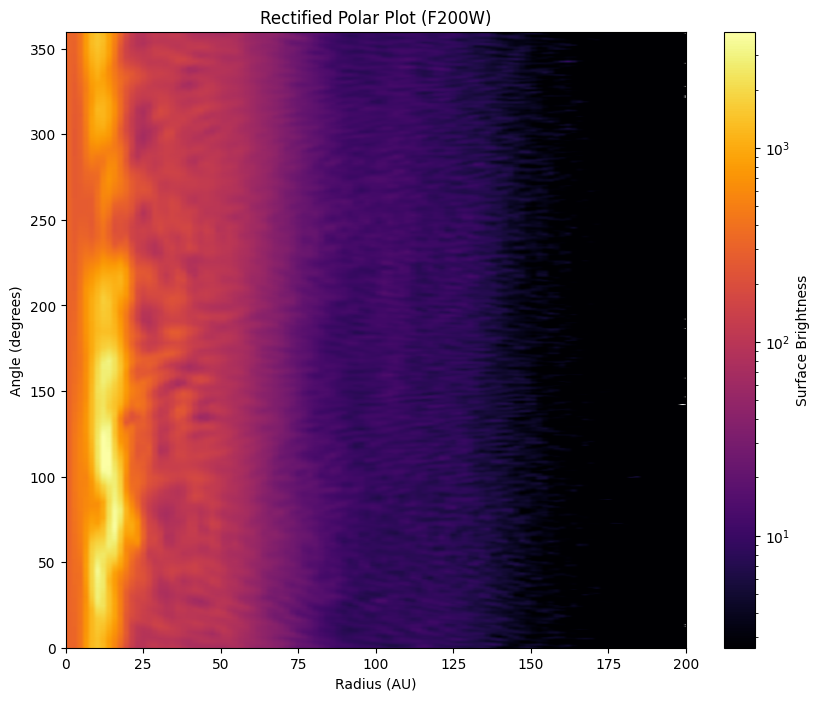

In [12]:
# Rectified Polar Plot
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F200W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,0]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.1 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

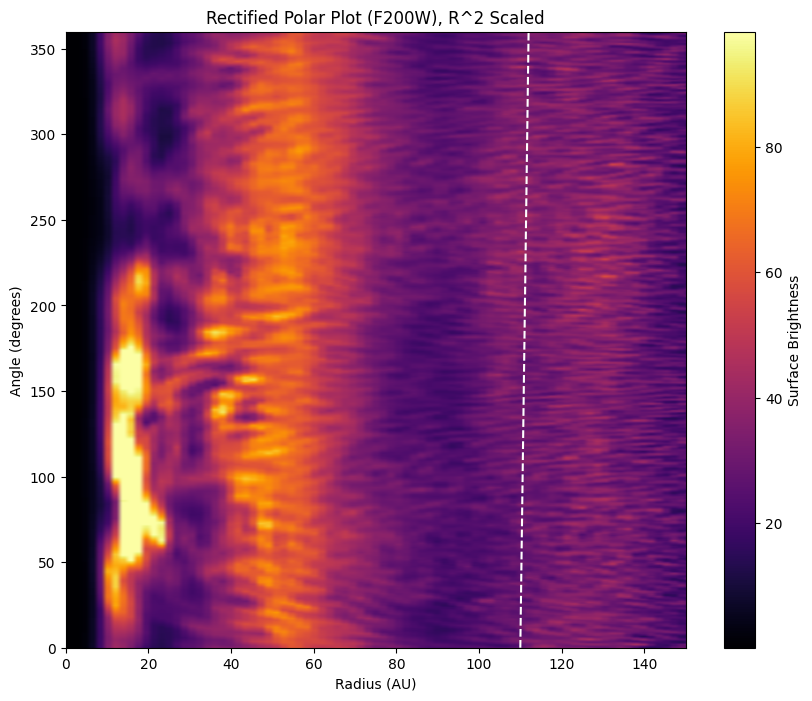

In [13]:
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

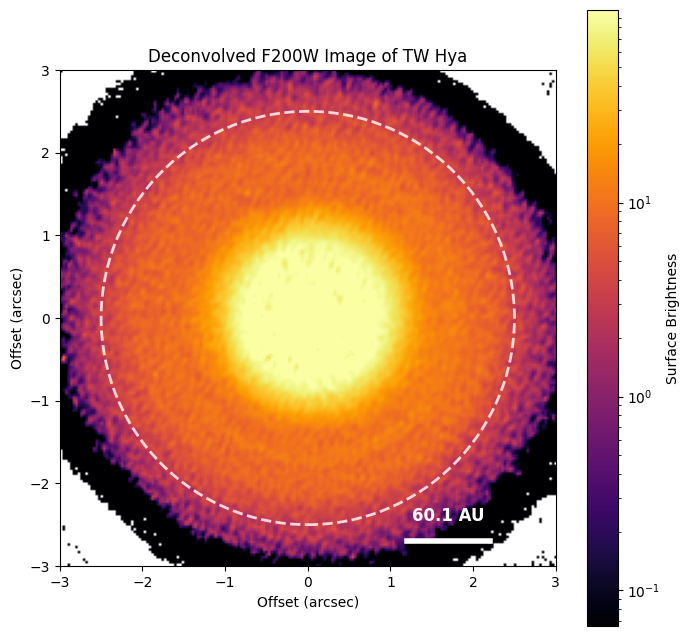

In [14]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()


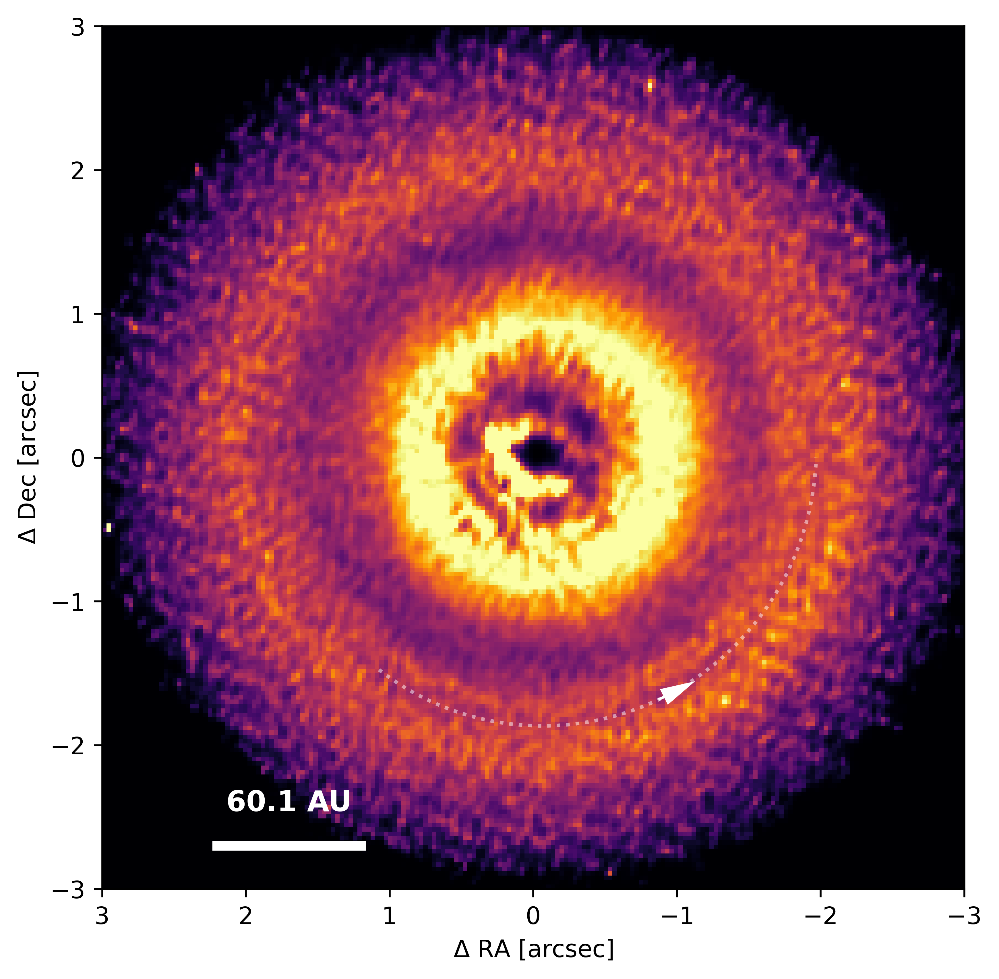

In [15]:
# --- Plot Original Image ---
plt.figure(figsize=(6.5, 6.5), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0, vmin=0.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(-x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
plt.arrow( -r_spiral[50]*np.cos(theta[50]), r_spiral[50]*np.sin(theta[50]),
           -0.5*(r_spiral[51]-r_spiral[50])*np.cos(theta[50])-r_spiral[50]*(-np.sin(theta[50])*(theta[51]-theta[50])),
           0.5*(r_spiral[51]-r_spiral[50])*np.sin(theta[50])+r_spiral[50]*(np.cos(theta[50])*(theta[51]-theta[50])),
           head_width=0.1, head_length=0.2, fc='white', ec='white')
           
# Add vertical (to the spiral) lines at the start and end of the spiral
'''
plt.plot([r_spiral[0]*np.cos(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.cos(theta[0]) + 0.1/2**0.5],
         [r_spiral[0]*np.sin(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.sin(theta[0]) + 0.1/2**0.5],
         color='white', linestyle='-', alpha=1)
plt.plot([r_spiral[-1]*np.cos(theta[-1]) + 0.1, r_spiral[-1]*np.cos(theta[-1]) - 0.1],
         [r_spiral[-1]*np.sin(theta[-1]), r_spiral[-1]*np.sin(theta[-1])],
         color='white', linestyle='-')
'''
# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

#plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.savefig('original_image.png', dpi=600, bbox_inches='tight')
plt.show()

Radius 39 au: Max at 148.2 deg, Min at 338.0 deg
Radius 53 au: Max at 194.8 deg, Min at 30.0 deg
Radius 88 au: Max at 260.9 deg, Min at 10.0 deg
Radius 141 au: Max at 80.6 deg, Min at 359.5 deg


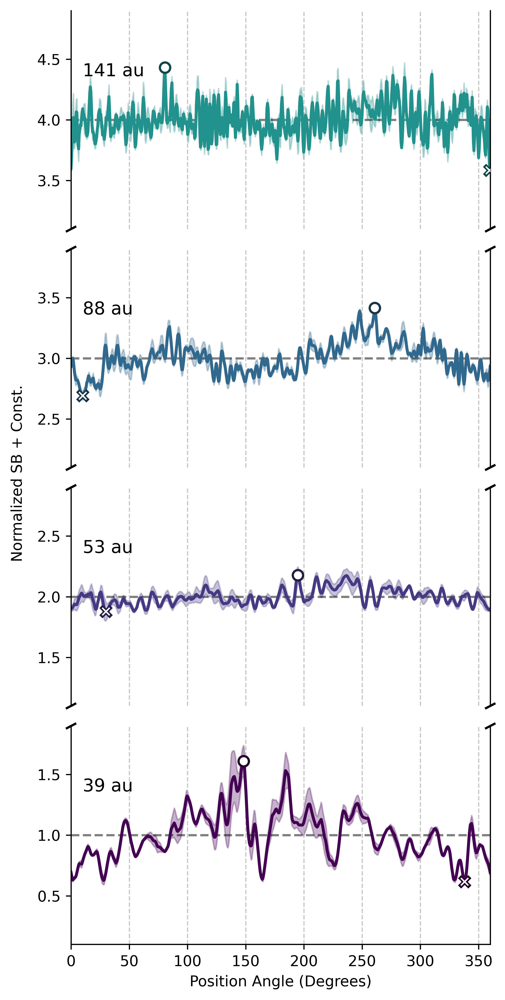

In [16]:
# Define the y-ranges you want to display
y_ranges = [(0.1, 1.9), (1.1, 2.9), (2.1, 3.9), (3.1, 4.9)]

# Create a figure with one column and a number of rows equal to your ranges
# We use sharex=True so all plots share the same x-axis and ticks
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)

# Remove the vertical space between the subplots
fig.subplots_adjust(hspace=0)

# Define the width of the annulus for averaging (in pixels)
annulus_width = 3
annulus_half_width = annulus_width // 2

# Radii of interest in au
radii_au = np.array([39, 53, 88, 141])

# Convert au to pixels
radii_pix_interest = (radii_au / dist) / pixel_scale

# Find the closest index in our radii_pix array
radii_indices = [np.argmin(np.abs(radii_pix - r)) for r in radii_pix_interest]

# Angles in degrees
angles_deg = np.rad2deg(thetas)

# Create a list of colors for the plots
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# --- Plot each profile on its corresponding subplot ---
# We reverse the axes so that the plot with the smallest y-values is at the bottom
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_idx = radii_indices[i]
    
    # Extract the brightness profile over an annulus
    start_idx = max(0, radius_idx - annulus_half_width)
    end_idx = min(polar_image.shape[1], radius_idx + annulus_half_width + 1)
    
    annulus_data = polar_image[:, start_idx:end_idx]
    
    profile = np.nanmean(annulus_data, axis=1)
    std_dev = np.nanstd(annulus_data, axis=1)
    
    pixel_number = annulus_data.shape[1]
    if pixel_number == 0: continue

    yerr = std_dev / np.sqrt(pixel_number)
    
    profile_mean = np.nanmean(profile)
    if np.isnan(profile_mean) or profile_mean == 0: continue

    # Add offset to separate the plots
    offset = i
    
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    color = colors[i]
    
    # Set the y-limits for this specific subplot
    ax.set_ylim(y_ranges[i])

    # Add dashed line at the mean level
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    
    ax.fill_between(angles_deg, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_deg, normalized_profile, '-', color=color, linewidth=2)
    
    # Add text annotation for the radius
    # Adjust y-position to be relative to the new ylim
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.0))
    
    # Mark the maximum and minimum points
    max_idx = np.nanargmax(normalized_profile)
    min_idx = np.nanargmin(normalized_profile)
    darker_color = np.copy(color)
    darker_color[:3] = darker_color[:3] * 0.5  # Darken the color for the marker edge
    ax.plot(angles_deg[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    print(f'Radius {radius_au} au: Max at {angles_deg[max_idx]:.1f} deg, Min at {angles_deg[min_idx]:.1f} deg')

    # --- Add break marks and clean up spines ---
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False) # Hide x-ticks
    
    # Add diagonal break marks to the y-axis spines
    d = .01 # size of the break marks
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes)-1: # Add marks to the top of all but the top-most plot
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: # Add marks to the bottom of all but the bottom-most plot
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final plot adjustments ---
# Only show the bottom spine and label for the last (bottom) plot
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

# Add a single y-label for the entire figure
fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')

# Optional: Add a title to the entire figure
# fig.suptitle(f'Azimuthal Surface Brightness Distribution with Error Shadow ({filter_name})', y=0.95)

plt.tight_layout(rect=[0.08, 0, 1, 0.95]) # Adjust layout to make space for labels
plt.savefig('azimuthal_distribution_broken_axis.png', dpi=300, bbox_inches='tight')
plt.show()

# F444W

### HPFRDI Image

Data loaded and polar transformation complete.


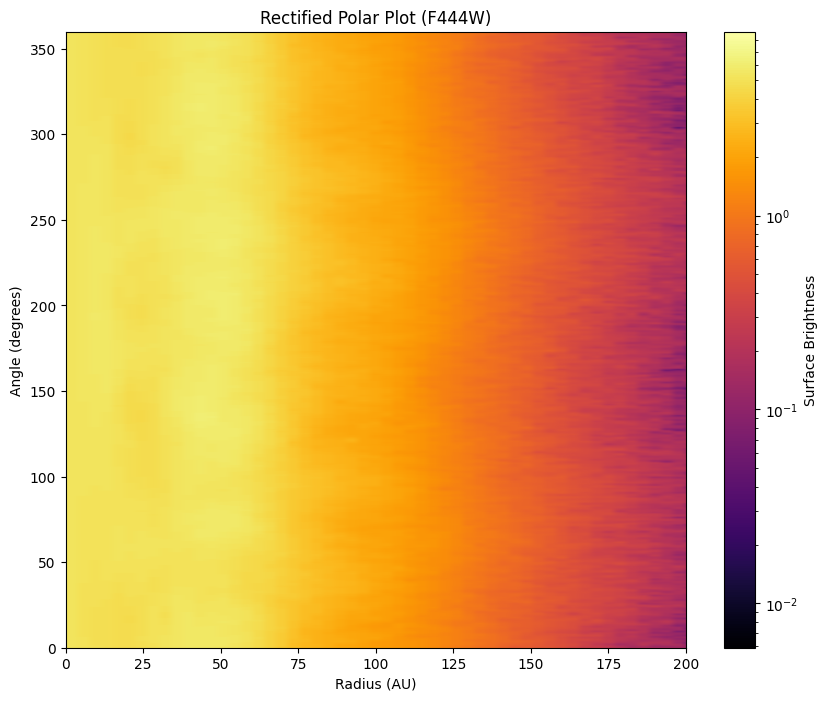

In [17]:
# Rectified Polar Plot
# Read fits file at source/F200W.fits
# Plot the data in a rectified polar plot

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F444W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,1]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.1 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))
print("Data loaded and polar transformation complete.")

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

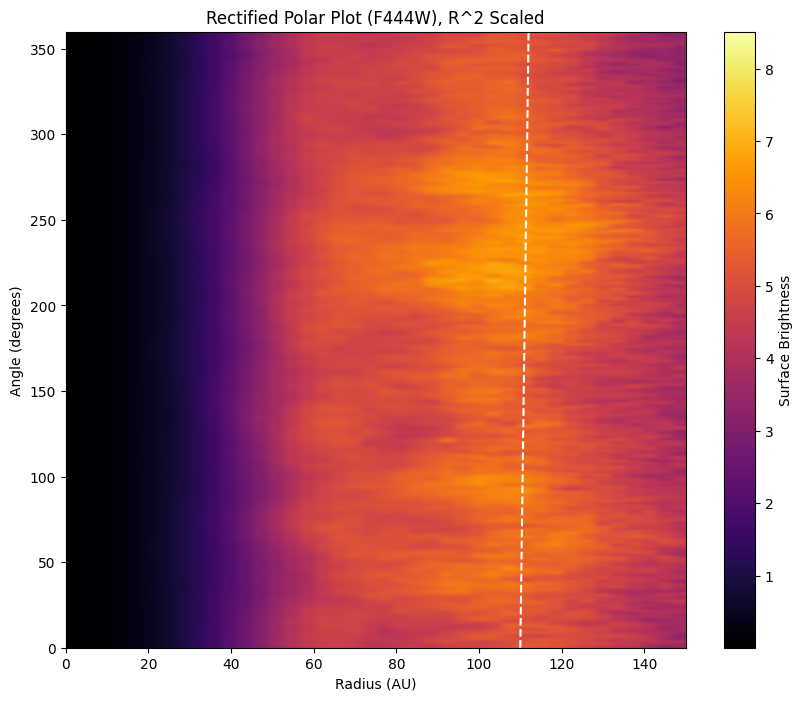

In [18]:
# --- Diagnostic: Check Radial Brightness Profile ---
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

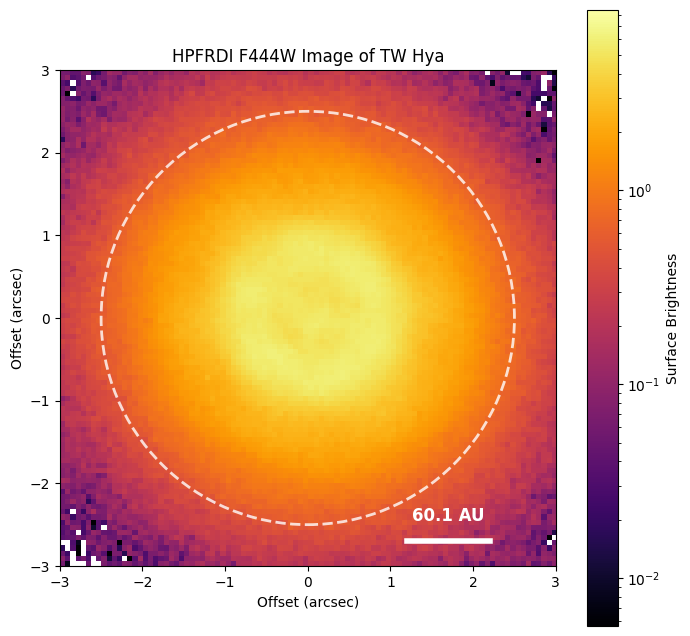

In [19]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'HPFRDI {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()

Radius 39 au: Max at 143.7 deg, Min at 47.1 deg
Radius 53 au: Max at 205.3 deg, Min at 42.6 deg
Radius 88 au: Max at 225.3 deg, Min at 10.5 deg
Radius 141 au: Max at 243.8 deg, Min at 346.5 deg


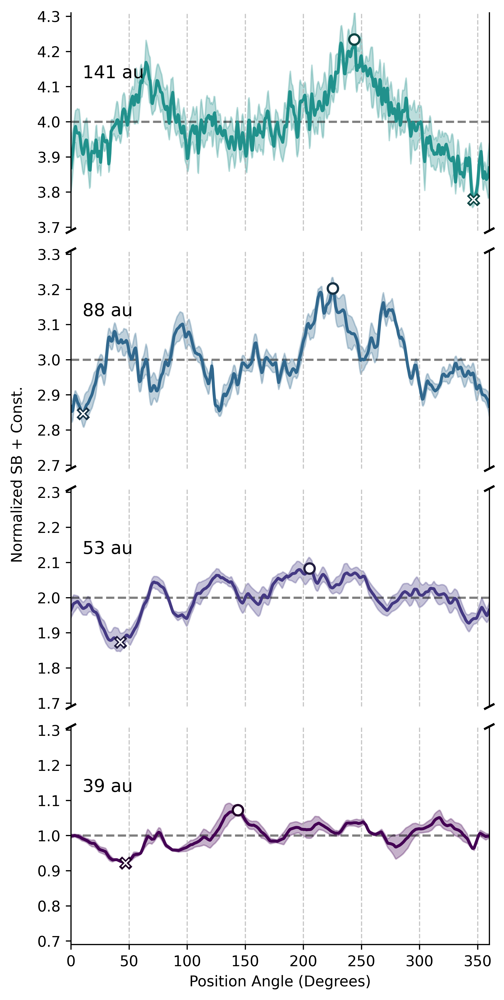

In [20]:
# Define the y-ranges you want to display
y_ranges = [(0.69,1.31), (1.69,2.31), (2.69,3.31), (3.69,4.31)]

# Create a figure with one column and a number of rows equal to your ranges
# We use sharex=True so all plots share the same x-axis and ticks
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)

# Remove the vertical space between the subplots
fig.subplots_adjust(hspace=0)

# Define the width of the annulus for averaging (in pixels)
annulus_width = 3
annulus_half_width = annulus_width // 2

# Radii of interest in au
radii_au = np.array([39, 53, 88, 141])

# Convert au to pixels
radii_pix_interest = (radii_au / dist) / pixel_scale

# Find the closest index in our radii_pix array
radii_indices = [np.argmin(np.abs(radii_pix - r)) for r in radii_pix_interest]

# Angles in degrees
angles_deg = np.rad2deg(thetas)

# Create a list of colors for the plots
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# --- Plot each profile on its corresponding subplot ---
# We reverse the axes so that the plot with the smallest y-values is at the bottom
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_idx = radii_indices[i]
    
    # Extract the brightness profile over an annulus
    start_idx = max(0, radius_idx - annulus_half_width)
    end_idx = min(polar_image.shape[1], radius_idx + annulus_half_width + 1)
    
    annulus_data = polar_image[:, start_idx:end_idx]
    
    profile = np.nanmean(annulus_data, axis=1)
    std_dev = np.nanstd(annulus_data, axis=1)
    
    pixel_number = annulus_data.shape[1]
    if pixel_number == 0: continue

    yerr = std_dev / np.sqrt(pixel_number)
    
    profile_mean = np.nanmean(profile)
    if np.isnan(profile_mean) or profile_mean == 0: continue

    # Add offset to separate the plots
    offset = i
    
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    color = colors[i]
    
    # Set the y-limits for this specific subplot
    ax.set_ylim(y_ranges[i])

    # Add dashed line at the mean level
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    
    ax.fill_between(angles_deg, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_deg, normalized_profile, '-', color=color, linewidth=2)
    
    # Add text annotation for the radius
    # Adjust y-position to be relative to the new ylim
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.0))
    
    # Mark the maximum and minimum points
    max_idx = np.nanargmax(normalized_profile)
    min_idx = np.nanargmin(normalized_profile)
    darker_color = np.copy(color)
    darker_color[:3] = darker_color[:3] * 0.5  # Darken the color for the marker edge
    ax.plot(angles_deg[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    print(f'Radius {radius_au} au: Max at {angles_deg[max_idx]:.1f} deg, Min at {angles_deg[min_idx]:.1f} deg')

    # --- Add break marks and clean up spines ---
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False) # Hide x-ticks
    
    # Add diagonal break marks to the y-axis spines
    d = .01 # size of the break marks
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes)-1: # Add marks to the top of all but the top-most plot
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: # Add marks to the bottom of all but the bottom-most plot
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final plot adjustments ---
# Only show the bottom spine and label for the last (bottom) plot
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

# Add a single y-label for the entire figure
fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')

# Optional: Add a title to the entire figure
# fig.suptitle(f'Azimuthal Surface Brightness Distribution with Error Shadow ({filter_name})', y=0.95)

plt.tight_layout(rect=[0.08, 0, 1, 0.95]) # Adjust layout to make space for labels
plt.savefig('azimuthal_distribution_broken_axis.png', dpi=300, bbox_inches='tight')
plt.show()


/tmp/ipykernel_2775916/1387849959.py:14: RuntimeWarning: Mean of empty slice
  radial_profile = np.nanmean(polar_image, axis=0)
/tmp/ipykernel_2775916/1387849959.py:15: RuntimeWarning: Mean of empty slice
  radial_profile_r2 = np.nanmean(polar_image_r2_scaled, axis=0)


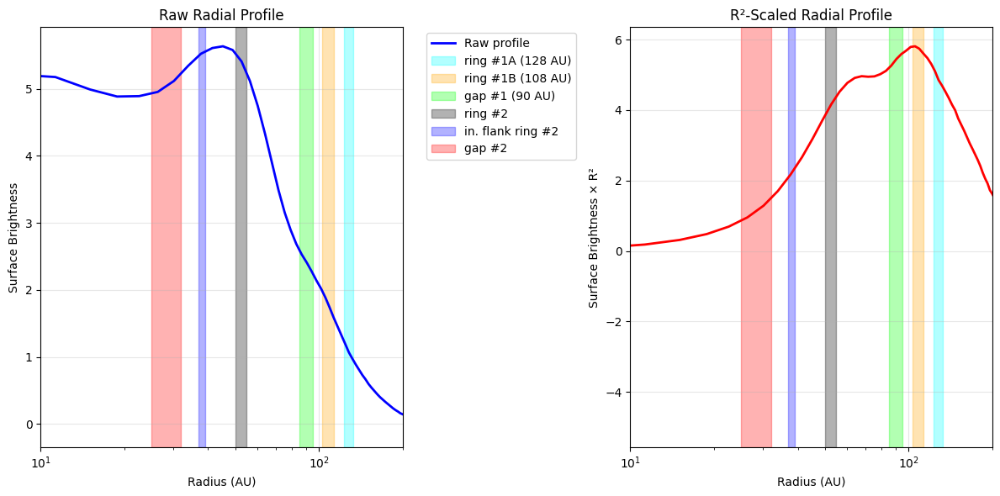


Numerical comparison of ring #1 vs gap #1:
ring #1A (128 AU) (123-133 AU):
  Raw mean: 1.08e+00
  R² mean: 4.89e+00
  Radius range in pixels: 33 to 35
ring #1B (108 AU) (103-113 AU):
  Raw mean: 1.81e+00
  R² mean: 5.74e+00
  Radius range in pixels: 27 to 30
gap #1 (90 AU) (85-95 AU):
  Raw mean: 2.41e+00
  R² mean: 5.44e+00
  Radius range in pixels: 23 to 25
ring #2 (50-55 AU):
  Raw mean: 5.37e+00
  R² mean: 4.13e+00
  Radius range in pixels: 13 to 15
in. flank ring #2 (37-39 AU):
  Raw mean: 5.52e+00
  R² mean: 2.17e+00
  Radius range in pixels: 10 to 10
gap #2 (25-32 AU):
  Raw mean: 5.04e+00
  R² mean: 1.12e+00
  Radius range in pixels: 7 to 8


In [21]:
# --- Diagnostic: Check Radial Brightness Profile ---
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)
        
# This cell helps identify why ring #1 and gap #1 show similar brightness

plt.figure(figsize=(12, 6))

# Calculate radial profile by averaging over all angles
radial_profile = np.nanmean(polar_image, axis=0)
radial_profile_r2 = np.nanmean(polar_image_r2_scaled, axis=0)
radii_au = radii_pix * pixel_scale * dist

# Plot both raw and R²-scaled profiles
ax1 = plt.subplot(1, 2, 1)
plt.plot(radii_au, radial_profile, 'b-', linewidth=2, label='Raw profile')
plt.xlabel('Radius (AU)')
plt.ylabel('Surface Brightness')
plt.title('Raw Radial Profile')
plt.xlim(10, 200)
plt.xscale('log')
plt.grid(True, alpha=0.3)

# Mark the regions we're analyzing
regions_check = {
    'ring #1A (128 AU)': (123, 133),
    'ring #1B (108 AU)': (103, 113),
    'gap #1 (90 AU)': (85, 95),
    'ring #2': (50, 55),
    'in. flank ring #2': (37, 39),
    'gap #2': (25, 32)
}

colors = ['cyan', 'orange', 'lime', 'black', 'blue', 'red']
for i, (name, (r_in, r_out)) in enumerate(regions_check.items()):
    plt.axvspan(r_in, r_out, alpha=0.3, color=colors[i], label=name)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Plot R²-scaled profile
ax2 = plt.subplot(1, 2, 2)
plt.plot(radii_au, radial_profile_r2, 'r-', linewidth=2, label='R² scaled profile')
plt.xlabel('Radius (AU)')
plt.ylabel('Surface Brightness × R²')
plt.title('R²-Scaled Radial Profile')
plt.xlim(10, 200)
plt.xscale('log')
plt.grid(True, alpha=0.3)

# Mark the same regions
for i, (name, (r_in, r_out)) in enumerate(regions_check.items()):
    plt.axvspan(r_in, r_out, alpha=0.3, color=colors[i])

plt.tight_layout()
plt.show()

# Print numerical values for the problematic regions
print("\nNumerical comparison of ring #1 vs gap #1:")
for name, (r_in, r_out) in regions_check.items():
    # Find pixel indices
    r_in_pix = (r_in / dist) / pixel_scale
    r_out_pix = (r_out / dist) / pixel_scale
    idx_in = np.argmin(np.abs(radii_pix - r_in_pix))
    idx_out = np.argmin(np.abs(radii_pix - r_out_pix))
    
    # Calculate mean brightness in this range
    raw_mean = np.nanmean(radial_profile[idx_in:idx_out+1])
    r2_mean = np.nanmean(radial_profile_r2[idx_in:idx_out+1])
    
    print(f"{name} ({r_in}-{r_out} AU):")
    print(f"  Raw mean: {raw_mean:.2e}")
    print(f"  R² mean: {r2_mean:.2e}")
    print(f"  Radius range in pixels: {idx_in} to {idx_out}")

ring #1A (128 AU) (123-133 AU): Mean brightness = 4.89e+00
  - Radial range in pixels: 33 to 35
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 1.08e+00
---
ring #1B (108 AU) (103-113 AU): Mean brightness = 5.74e+00
  - Radial range in pixels: 27 to 30
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 1.81e+00
---
gap #1 (90 AU) (85-95 AU): Mean brightness = 5.44e+00
  - Radial range in pixels: 23 to 25
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 2.41e+00
---
ring #2 (50-55 AU): Mean brightness = 4.13e+00
  - Radial range in pixels: 13 to 15
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 5.37e+00
---
gap #2 (25-32 AU): Mean brightness = 1.12e+00
  - Radial range in pixels: 7 to 8
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 5.04e+00
---


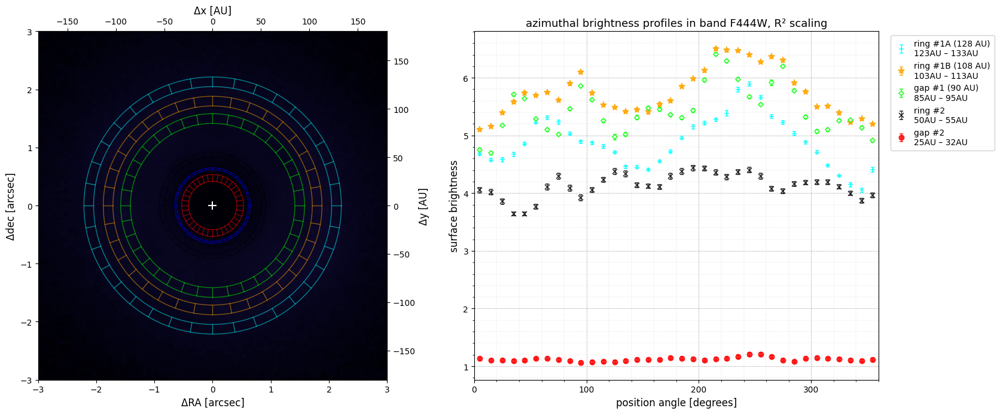

In [22]:
# --- Reproduce Figure 5 from the paper ---

# This cell reproduces the two-panel figure provided in the prompt.
# Left panel: The original image with overlays showing the annuli used for analysis.
# Right panel: The azimuthal brightness profiles for each annulus.

# --- Setup ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8), dpi=100)
plt.subplots_adjust(wspace=0.3)
num_spokes = 36
colors = ['cyan', 'orange', 'lime', 'black', 'blue', 'red']

# --- Left Plot: Image with Overlays ---

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

ax1.imshow(cropped_image*distances**2, origin='lower', cmap='inferno', 
           vmax=100,
           extent=extent)

# Define regions from the right plot's legend in the paper
# Mark the regions we're analyzing with regions_check
markers = ['+', '*', 'D', 'x', '^', 'o']
size = [6, 8, 4, 6, 5, 6]  # Sizes for each marker
regions = {}
for i, (name, (r_in, r_out)) in enumerate(regions_check.items()):
    regions[name] = {
        'range': (r_in, r_out),
        'color': colors[i],
        'marker': markers[i],
        'size': size[i]
    }

# Draw the exact regions being analyzed in the right panel on the left image
# This ensures the overlays match the actual data being plotted
for name, props in regions.items():
    r_inner_au, r_outer_au = props['range']
    r_inner_arcsec = r_inner_au / dist
    r_outer_arcsec = r_outer_au / dist
    color = props['color']
    
    # Draw annulus boundaries for each region
    ring_inner = plt.Circle((0, 0), r_inner_arcsec, fill=False, color=color, 
                           linewidth=1, alpha=0.5, linestyle='-')
    ring_outer = plt.Circle((0, 0), r_outer_arcsec, fill=False, color=color, 
                           linewidth=1, alpha=0.5, linestyle='-')
    ax1.add_patch(ring_inner)
    ax1.add_patch(ring_outer)

    # Draw radial spokes ('spider') to show analysis zone
    for j in range(num_spokes):
        theta_spoke = 2 * np.pi * j / num_spokes
        x_inner = r_inner_arcsec * np.cos(theta_spoke)
        y_inner = r_inner_arcsec * np.sin(theta_spoke)
        x_outer = r_outer_arcsec * np.cos(theta_spoke)
        y_outer = r_outer_arcsec * np.sin(theta_spoke)
        ax1.plot([x_inner, x_outer], [y_inner, y_outer], color=color, linewidth=1, alpha=0.5)

    '''
    # Add a text label for each region
    short_label = name.replace(' (80 AU)', '').replace('in. flank ', '')
    mid_radius = (r_inner_arcsec + r_outer_arcsec) / 2
    angle_label = np.pi / 4  # 45 degrees
    label_x = mid_radius * np.cos(angle_label)
    label_y = mid_radius * np.sin(angle_label)
    ax1.text(label_x, label_y, short_label, color=color, fontsize=8, 
             fontweight='bold', ha='center', va='center',
             bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))
    '''

# Add central star marker with a cross
ax1.plot(0, 0, marker='+', markersize=10, color='white', markeredgewidth=1.5, label='central star')

# Set up axes for the left plot
ax1.set_xlabel('ΔRA [arcsec]', fontsize=12)
ax1.set_ylabel('Δdec [arcsec]', fontsize=12)
ax1.set_xlim(extent[0], extent[1])
ax1.set_ylim(extent[2], extent[3])
ax1.set_aspect('equal', 'box')

# Add secondary axes in AU
secax_x = ax1.secondary_xaxis('top', functions=(lambda x: x * dist, lambda x: x / dist))
secax_x.set_xlabel('Δx [AU]', fontsize=12)
secax_y = ax1.secondary_yaxis('right', functions=(lambda y: y * dist, lambda y: y / dist))
secax_y.set_ylabel('Δy [AU]', fontsize=12)

# --- Right Plot: Azimuthal Brightness Profiles ----
# Create angle array
angles_deg = np.rad2deg(thetas)

# Plot each profile with proper styling
for name, props in list(regions.items()):
    r_inner_au, r_outer_au = props['range']
    
    # Convert AU to pixel radius
    r_inner_pix = (r_inner_au / dist) / pixel_scale
    r_outer_pix = (r_outer_au / dist) / pixel_scale
    
    # Find indices in radii_pix array
    idx_inner = np.argmin(np.abs(radii_pix - r_inner_pix))
    idx_outer = np.argmin(np.abs(radii_pix - r_outer_pix))
    
    if idx_inner >= idx_outer:
        continue

    # Extract annulus data
    annulus_data = polar_image_r2_scaled[:, idx_inner:idx_outer+1]
    
    # Build angular sections based on num_spokes
    angles_edges = np.linspace(0, 2 * np.pi, num_spokes + 1)
    angles_mid = (angles_edges[:-1] + angles_edges[1:]) / 2
    angles_deg_mid = np.rad2deg(angles_mid)

    # Compute section-wise mean and error
    profile = []
    yerr = []
    for j in range(num_spokes):
        # Mask angular slice
        mask_ang = (thetas >= angles_edges[j]) & (thetas < angles_edges[j+1])
        # Extract data for this segment and radial range
        seg_data = annulus_data[mask_ang, :].ravel()
        seg_data = seg_data[~np.isnan(seg_data)]
        if seg_data.size > 0:
            m = np.mean(seg_data)
            e = np.std(seg_data) / np.sqrt(seg_data.size)
        else:
            m, e = np.nan, np.nan
        profile.append(m)
        yerr.append(e)
    profile = np.array(profile)
    yerr = np.array(yerr)

    # Plot with segment-wise error bars
    ax2.errorbar(angles_deg_mid, profile, yerr=yerr,
                 fmt=props['marker'], markersize=props['size'], capsize=2,
                 color=props['color'], ecolor=props['color'], elinewidth=1,
                 markeredgecolor=props['color'],
                 markerfacecolor='white' if props['marker'] in ['D','s','^'] else props['color'],
                 label=f"{name}\n{r_inner_au}AU – {r_outer_au}AU", alpha=0.8,
                 linestyle='None', markeredgewidth=1.2)
    
    # Debug: Print brightness values for comparison
    mean_brightness = np.nanmean(profile)
    print(f"{name} ({r_inner_au}-{r_outer_au} AU): Mean brightness = {mean_brightness:.2e}")
    print(f"  - Radial range in pixels: {idx_inner} to {idx_outer}")
    print(f"  - Radial range in arcsec: {r_inner_arcsec:.3f} to {r_outer_arcsec:.3f}")
    
    # Also check the raw (unscaled) data for comparison
    annulus_data_raw = polar_image[:, idx_inner:idx_outer+1]
    raw_mean = np.nanmean(annulus_data_raw)
    print(f"  - Raw (no R²) mean brightness: {raw_mean:.2e}")
    print("---")

# Set up axes and styling to match the paper
ax2.set_title(f'azimuthal brightness profiles in band {filter_name}, R² scaling', fontsize=13)
ax2.set_xlabel('position angle [degrees]', fontsize=12)
ax2.set_ylabel('surface brightness', fontsize=12)
ax2.set_xlim(0, 360)
ax2.set_xticks([0, 100, 200, 300])
ax2.minorticks_on()
ax2.grid(which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)
ax2.grid(which='minor', linestyle=':', linewidth=0.3, color='gray', alpha=0.5)

# Create legend positioned to not overlap with data
legend = ax2.legend(bbox_to_anchor=(1.02, 1), loc='upper left', 
                   fontsize=10, handlelength=1.5, frameon=True, 
                   facecolor='white', framealpha=0.9, borderpad=0.5)

# --- Final Figure Adjustments ---

# Add figure caption
#fig.suptitle(f'Figure 1. Azimuthal intensity profiles in the {filter_name}-band, radially integrated over the gap and ring regions as indicated in the image.\nA distance of {dist:.1f} pc has been assumed.', 
#            fontsize=11, y=0.02, ha='center')

plt.tight_layout(rect=[0, 0.08, 0.85, 0.96])
plt.savefig('azimuthal.png', dpi=300, bbox_inches='tight')
plt.show()


### Deconvolved Image

Data loaded and polar transformation complete.


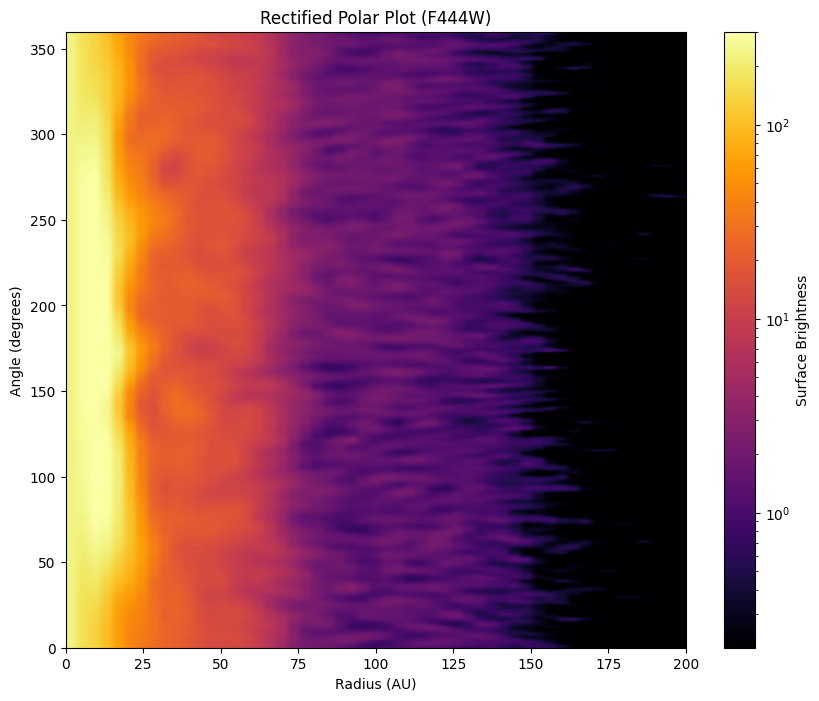

In [23]:
# Rectified Polar Plot
# Read fits file at source/F200W.fits
# Plot the data in a rectified polar plot

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F444W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,0]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.1 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))
print("Data loaded and polar transformation complete.")

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

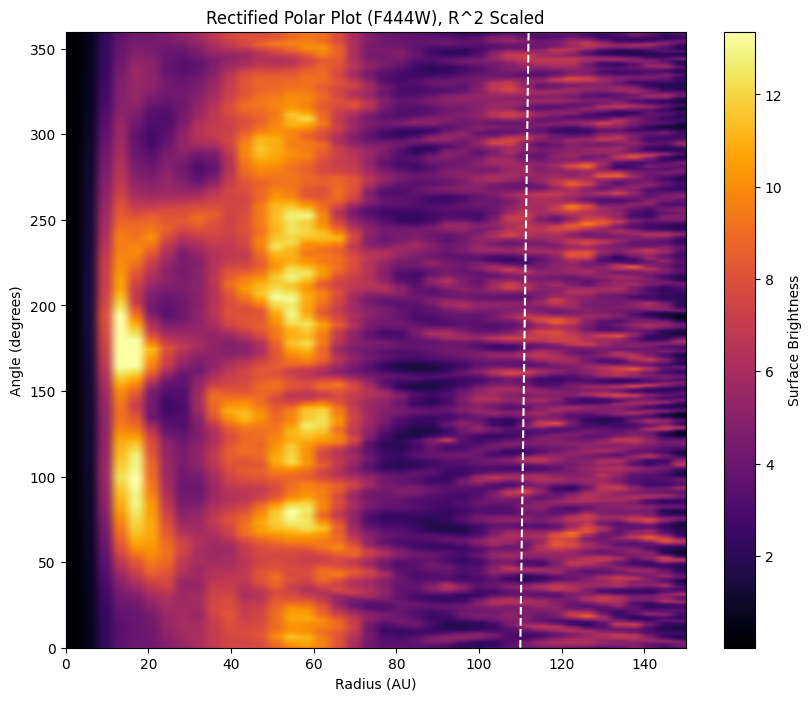

In [24]:
# --- Diagnostic: Check Radial Brightness Profile ---
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

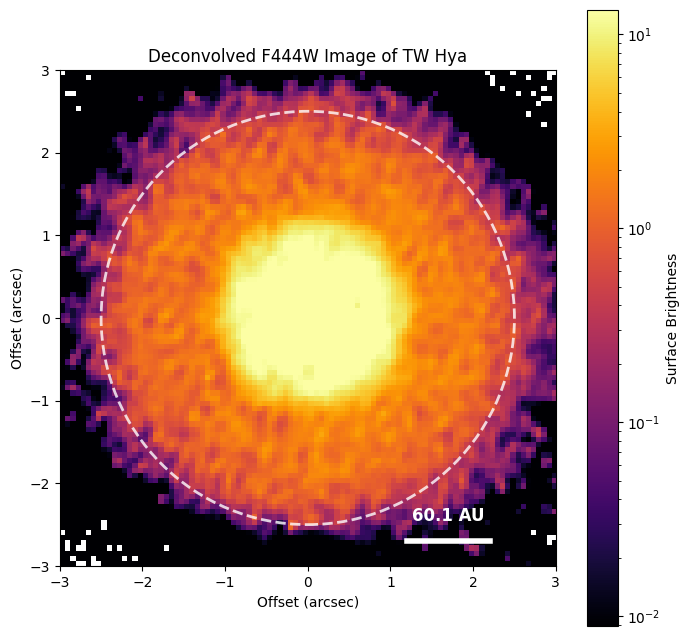

In [25]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()

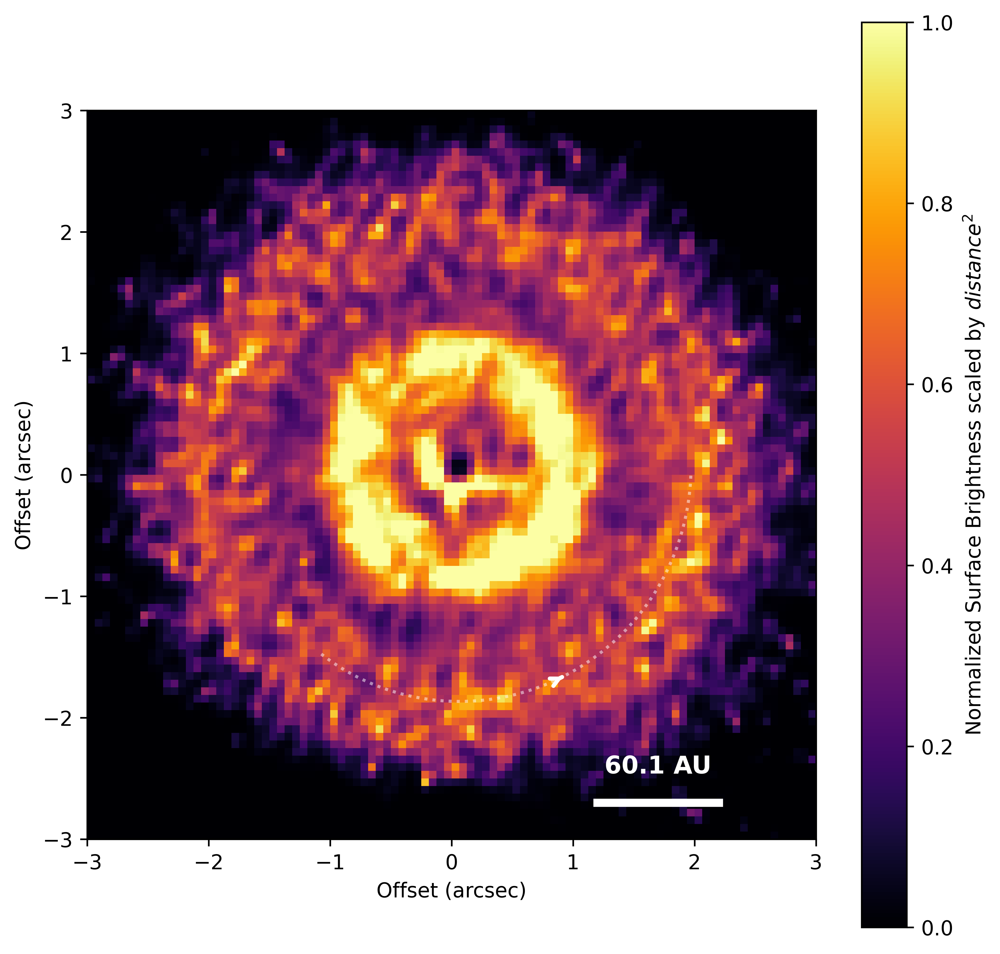

In [26]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
arrow_start = (r_spiral[50] * np.cos(theta[50]), r_spiral[50] * np.sin(theta[50]))
arrow_end = (r_spiral[51] * np.cos(theta[51]), r_spiral[51] * np.sin(theta[51]))
plt.annotate('', xy=arrow_end, xytext=arrow_start,
            arrowprops=dict(facecolor='white', edgecolor='white', arrowstyle='->', lw=2))

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()

Radius 39 au: Max at 138.2 deg, Min at 176.7 deg
Radius 53 au: Max at 204.8 deg, Min at 343.0 deg
Radius 88 au: Max at 183.8 deg, Min at 163.7 deg
Radius 141 au: Max at 64.6 deg, Min at 347.5 deg


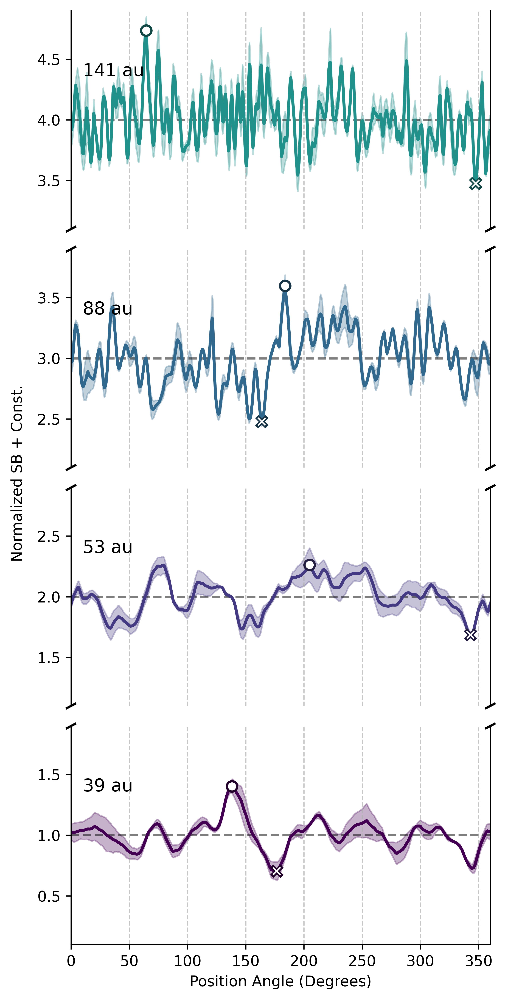

In [27]:
# Define the y-ranges you want to display
y_ranges = [(0.1, 1.9), (1.1, 2.9), (2.1, 3.9), (3.1, 4.9)]

# Create a figure with one column and a number of rows equal to your ranges
# We use sharex=True so all plots share the same x-axis and ticks
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)

# Remove the vertical space between the subplots
fig.subplots_adjust(hspace=0)

# Define the width of the annulus for averaging (in pixels)
annulus_width = 3
annulus_half_width = annulus_width // 2

# Radii of interest in au
radii_au = np.array([39, 53, 88, 141])

# Convert au to pixels
radii_pix_interest = (radii_au / dist) / pixel_scale

# Find the closest index in our radii_pix array
radii_indices = [np.argmin(np.abs(radii_pix - r)) for r in radii_pix_interest]

# Angles in degrees
angles_deg = np.rad2deg(thetas)

# Create a list of colors for the plots
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# --- Plot each profile on its corresponding subplot ---
# We reverse the axes so that the plot with the smallest y-values is at the bottom
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_idx = radii_indices[i]
    
    # Extract the brightness profile over an annulus
    start_idx = max(0, radius_idx - annulus_half_width)
    end_idx = min(polar_image.shape[1], radius_idx + annulus_half_width + 1)
    
    annulus_data = polar_image[:, start_idx:end_idx]
    
    profile = np.nanmean(annulus_data, axis=1)
    std_dev = np.nanstd(annulus_data, axis=1)
    
    pixel_number = annulus_data.shape[1]
    if pixel_number == 0: continue

    yerr = std_dev / np.sqrt(pixel_number)
    
    profile_mean = np.nanmean(profile)
    if np.isnan(profile_mean) or profile_mean == 0: continue

    # Add offset to separate the plots
    offset = i
    
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    color = colors[i]
    
    # Set the y-limits for this specific subplot
    ax.set_ylim(y_ranges[i])

    # Add dashed line at the mean level
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    
    ax.fill_between(angles_deg, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_deg, normalized_profile, '-', color=color, linewidth=2)
    
    # Add text annotation for the radius
    # Adjust y-position to be relative to the new ylim
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.0))
    
    # Mark the maximum and minimum points
    max_idx = np.nanargmax(normalized_profile)
    min_idx = np.nanargmin(normalized_profile)
    darker_color = np.copy(color)
    darker_color[:3] = darker_color[:3] * 0.5  # Darken the color for the marker edge
    ax.plot(angles_deg[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    print(f'Radius {radius_au} au: Max at {angles_deg[max_idx]:.1f} deg, Min at {angles_deg[min_idx]:.1f} deg')

    # --- Add break marks and clean up spines ---
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False) # Hide x-ticks
    
    # Add diagonal break marks to the y-axis spines
    d = .01 # size of the break marks
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes)-1: # Add marks to the top of all but the top-most plot
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: # Add marks to the bottom of all but the bottom-most plot
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final plot adjustments ---
# Only show the bottom spine and label for the last (bottom) plot
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

# Add a single y-label for the entire figure
fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')

# Optional: Add a title to the entire figure
# fig.suptitle(f'Azimuthal Surface Brightness Distribution with Error Shadow ({filter_name})', y=0.95)

plt.tight_layout(rect=[0.08, 0, 1, 0.95]) # Adjust layout to make space for labels
plt.savefig('azimuthal_distribution_broken_axis.png', dpi=300, bbox_inches='tight')
plt.show()

# F356W

### HPFRDI Image

Data loaded and polar transformation complete.


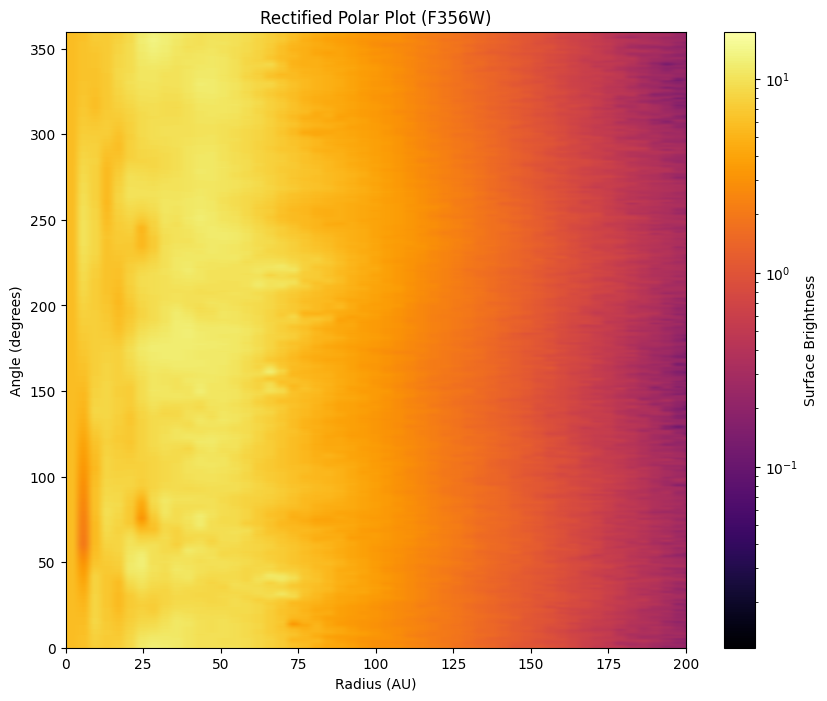

In [28]:
# Rectified Polar Plot
# Read fits file at source/F200W.fits
# Plot the data in a rectified polar plot

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F356W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,1]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.1 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))
print("Data loaded and polar transformation complete.")

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

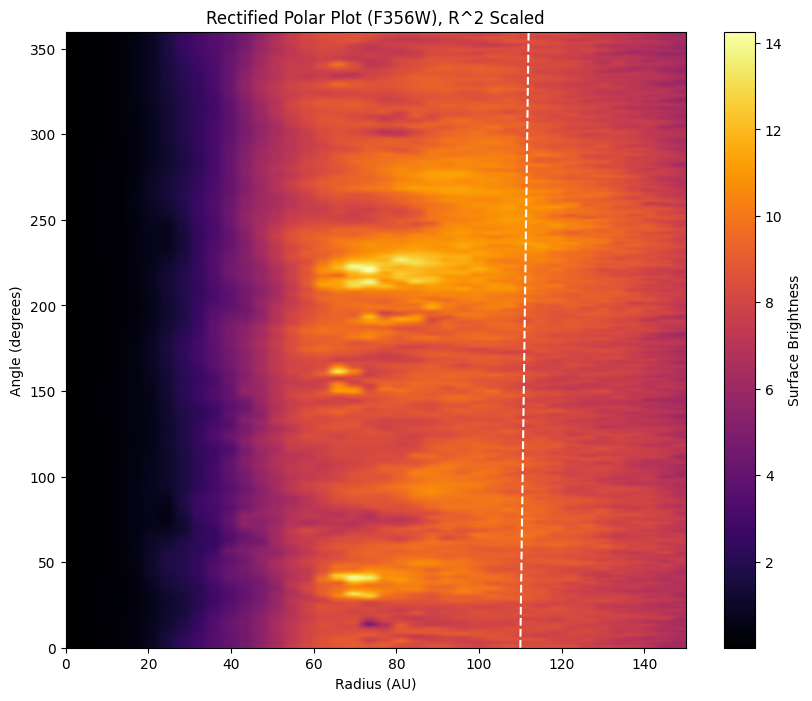

In [29]:
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

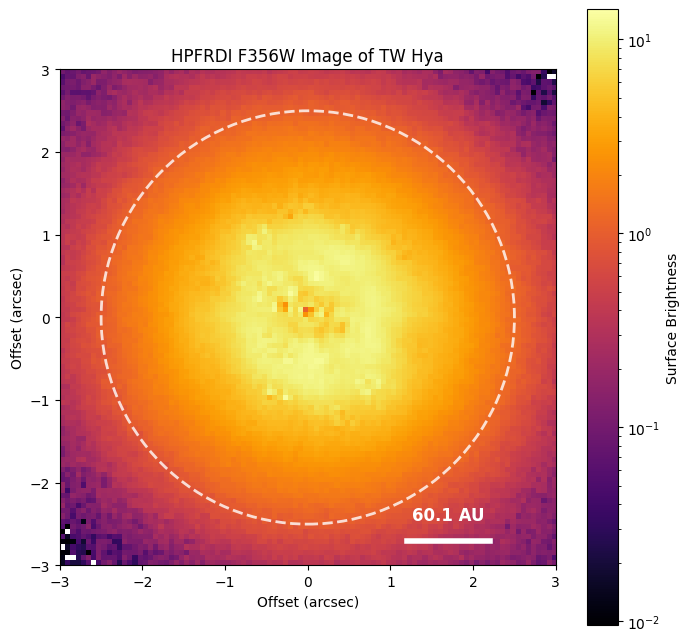

In [30]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'HPFRDI {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()


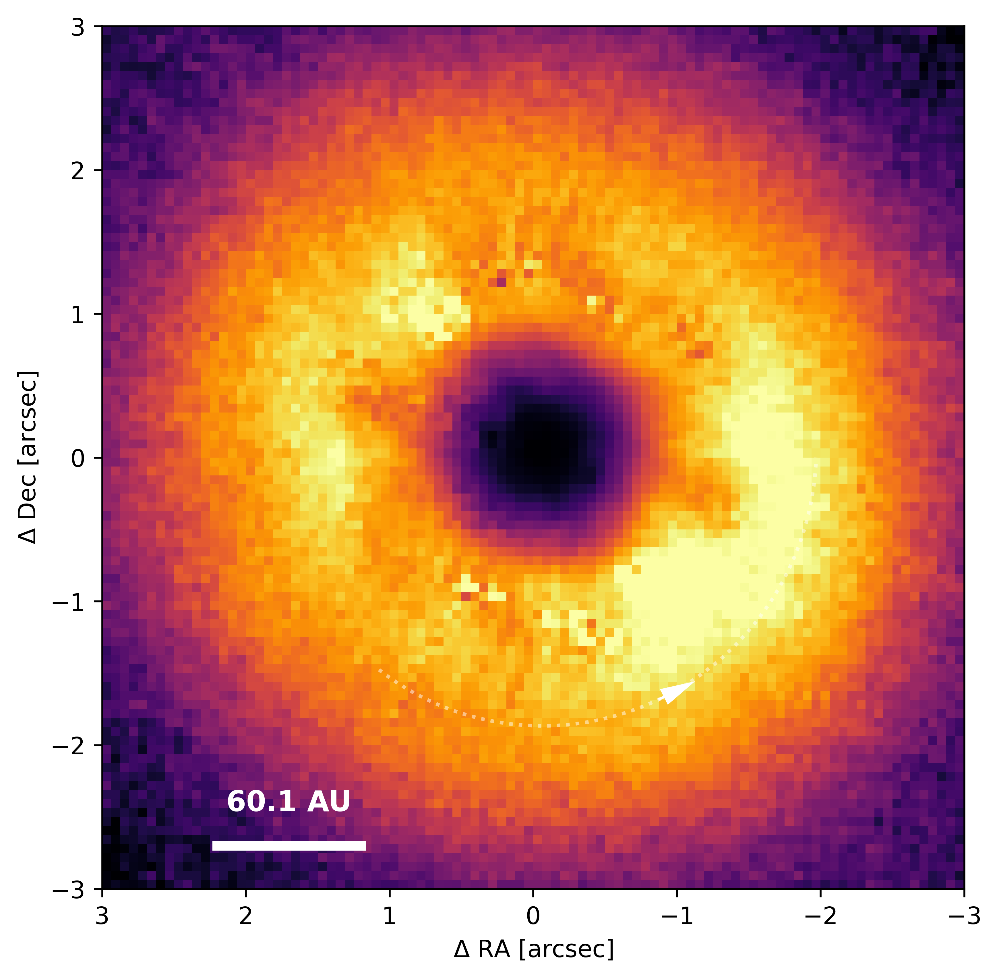

In [31]:
# --- Plot Original Image ---
plt.figure(figsize=(6.5, 6.5), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0, vmin=0.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(-x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
plt.arrow( -r_spiral[50]*np.cos(theta[50]), r_spiral[50]*np.sin(theta[50]),
           -0.5*(r_spiral[51]-r_spiral[50])*np.cos(theta[50])-r_spiral[50]*(-np.sin(theta[50])*(theta[51]-theta[50])),
           0.5*(r_spiral[51]-r_spiral[50])*np.sin(theta[50])+r_spiral[50]*(np.cos(theta[50])*(theta[51]-theta[50])),
           head_width=0.1, head_length=0.2, fc='white', ec='white')
           
# Add vertical (to the spiral) lines at the start and end of the spiral
'''
plt.plot([r_spiral[0]*np.cos(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.cos(theta[0]) + 0.1/2**0.5],
         [r_spiral[0]*np.sin(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.sin(theta[0]) + 0.1/2**0.5],
         color='white', linestyle='-', alpha=1)
plt.plot([r_spiral[-1]*np.cos(theta[-1]) + 0.1, r_spiral[-1]*np.cos(theta[-1]) - 0.1],
         [r_spiral[-1]*np.sin(theta[-1]), r_spiral[-1]*np.sin(theta[-1])],
         color='white', linestyle='-')
'''
# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

#plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.savefig('original_image.png', dpi=600, bbox_inches='tight')
plt.show()

Radius 39 au: Max at 182.8 deg, Min at 63.6 deg
Radius 53 au: Max at 185.8 deg, Min at 87.6 deg
Radius 88 au: Max at 224.8 deg, Min at 356.0 deg
Radius 141 au: Max at 244.8 deg, Min at 348.0 deg


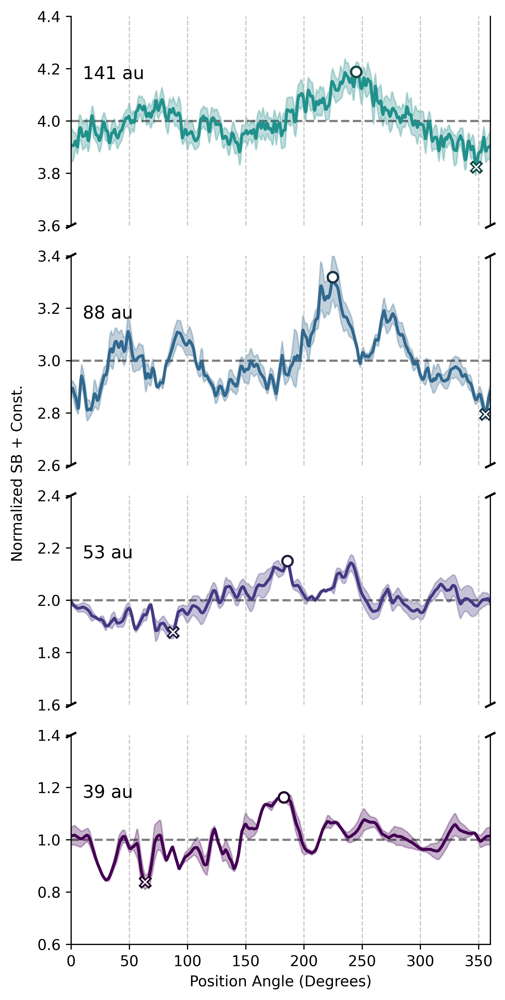

In [32]:
# Define the y-ranges you want to display
y_ranges = [(0.6, 1.4), (1.6, 2.4), (2.6, 3.4), (3.6, 4.4)]

# Create a figure with one column and a number of rows equal to your ranges
# We use sharex=True so all plots share the same x-axis and ticks
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)

# Remove the vertical space between the subplots
fig.subplots_adjust(hspace=0)

# Define the width of the annulus for averaging (in pixels)
annulus_width = 3
annulus_half_width = annulus_width // 2

# Radii of interest in au
radii_au = np.array([39, 53, 88, 141])

# Convert au to pixels
radii_pix_interest = (radii_au / dist) / pixel_scale

# Find the closest index in our radii_pix array
radii_indices = [np.argmin(np.abs(radii_pix - r)) for r in radii_pix_interest]

# Angles in degrees
angles_deg = np.rad2deg(thetas)

# Create a list of colors for the plots
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# --- Plot each profile on its corresponding subplot ---
# We reverse the axes so that the plot with the smallest y-values is at the bottom
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_idx = radii_indices[i]
    
    # Extract the brightness profile over an annulus
    start_idx = max(0, radius_idx - annulus_half_width)
    end_idx = min(polar_image.shape[1], radius_idx + annulus_half_width + 1)
    
    annulus_data = polar_image[:, start_idx:end_idx]
    
    profile = np.nanmean(annulus_data, axis=1)
    std_dev = np.nanstd(annulus_data, axis=1)
    
    pixel_number = annulus_data.shape[1]
    if pixel_number == 0: continue

    yerr = std_dev / np.sqrt(pixel_number)
    
    profile_mean = np.nanmean(profile)
    if np.isnan(profile_mean) or profile_mean == 0: continue

    # Add offset to separate the plots
    offset = i
    
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    color = colors[i]
    
    # Set the y-limits for this specific subplot
    ax.set_ylim(y_ranges[i])

    # Add dashed line at the mean level
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    
    ax.fill_between(angles_deg, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_deg, normalized_profile, '-', color=color, linewidth=2)
    
    # Add text annotation for the radius
    # Adjust y-position to be relative to the new ylim
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.0))
    
    # Mark the maximum and minimum points
    max_idx = np.nanargmax(normalized_profile)
    min_idx = np.nanargmin(normalized_profile)
    darker_color = np.copy(color)
    darker_color[:3] = darker_color[:3] * 0.5  # Darken the color for the marker edge
    ax.plot(angles_deg[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    print(f'Radius {radius_au} au: Max at {angles_deg[max_idx]:.1f} deg, Min at {angles_deg[min_idx]:.1f} deg')

    # --- Add break marks and clean up spines ---
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False) # Hide x-ticks
    
    # Add diagonal break marks to the y-axis spines
    d = .01 # size of the break marks
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes)-1: # Add marks to the top of all but the top-most plot
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: # Add marks to the bottom of all but the bottom-most plot
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final plot adjustments ---
# Only show the bottom spine and label for the last (bottom) plot
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

# Add a single y-label for the entire figure
fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')

# Optional: Add a title to the entire figure
# fig.suptitle(f'Azimuthal Surface Brightness Distribution with Error Shadow ({filter_name})', y=0.95)

plt.tight_layout(rect=[0.08, 0, 1, 0.95]) # Adjust layout to make space for labels
plt.savefig('azimuthal_distribution_broken_axis.png', dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_2775916/1387849959.py:14: RuntimeWarning: Mean of empty slice
  radial_profile = np.nanmean(polar_image, axis=0)
/tmp/ipykernel_2775916/1387849959.py:15: RuntimeWarning: Mean of empty slice
  radial_profile_r2 = np.nanmean(polar_image_r2_scaled, axis=0)


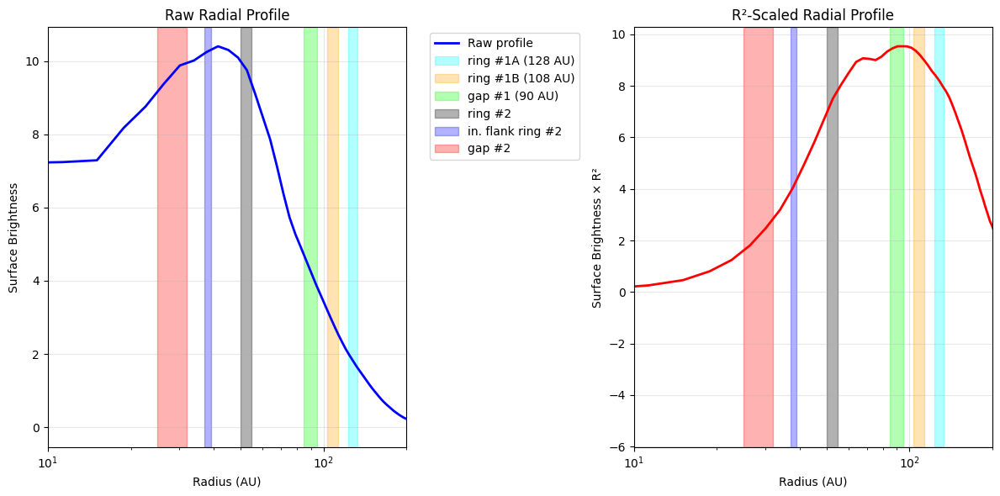


Numerical comparison of ring #1 vs gap #1:
ring #1A (128 AU) (123-133 AU):
  Raw mean: 1.81e+00
  R² mean: 8.20e+00
  Radius range in pixels: 33 to 35
ring #1B (108 AU) (103-113 AU):
  Raw mean: 2.92e+00
  R² mean: 9.26e+00
  Radius range in pixels: 27 to 30
gap #1 (90 AU) (85-95 AU):
  Raw mean: 4.22e+00
  R² mean: 9.51e+00
  Radius range in pixels: 23 to 25
ring #2 (50-55 AU):
  Raw mean: 9.65e+00
  R² mean: 7.42e+00
  Radius range in pixels: 13 to 15
in. flank ring #2 (37-39 AU):
  Raw mean: 1.02e+01
  R² mean: 4.03e+00
  Radius range in pixels: 10 to 10
gap #2 (25-32 AU):
  Raw mean: 9.63e+00
  R² mean: 2.15e+00
  Radius range in pixels: 7 to 8


In [33]:
# --- Diagnostic: Check Radial Brightness Profile ---
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)
        
# This cell helps identify why ring #1 and gap #1 show similar brightness

plt.figure(figsize=(12, 6))

# Calculate radial profile by averaging over all angles
radial_profile = np.nanmean(polar_image, axis=0)
radial_profile_r2 = np.nanmean(polar_image_r2_scaled, axis=0)
radii_au = radii_pix * pixel_scale * dist

# Plot both raw and R²-scaled profiles
ax1 = plt.subplot(1, 2, 1)
plt.plot(radii_au, radial_profile, 'b-', linewidth=2, label='Raw profile')
plt.xlabel('Radius (AU)')
plt.ylabel('Surface Brightness')
plt.title('Raw Radial Profile')
plt.xlim(10, 200)
plt.xscale('log')
plt.grid(True, alpha=0.3)

# Mark the regions we're analyzing
regions_check = {
    'ring #1A (128 AU)': (123, 133),
    'ring #1B (108 AU)': (103, 113),
    'gap #1 (90 AU)': (85, 95),
    'ring #2': (50, 55),
    'in. flank ring #2': (37, 39),
    'gap #2': (25, 32)
}

colors = ['cyan', 'orange', 'lime', 'black', 'blue', 'red']
for i, (name, (r_in, r_out)) in enumerate(regions_check.items()):
    plt.axvspan(r_in, r_out, alpha=0.3, color=colors[i], label=name)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Plot R²-scaled profile
ax2 = plt.subplot(1, 2, 2)
plt.plot(radii_au, radial_profile_r2, 'r-', linewidth=2, label='R² scaled profile')
plt.xlabel('Radius (AU)')
plt.ylabel('Surface Brightness × R²')
plt.title('R²-Scaled Radial Profile')
plt.xlim(10, 200)
plt.xscale('log')
plt.grid(True, alpha=0.3)

# Mark the same regions
for i, (name, (r_in, r_out)) in enumerate(regions_check.items()):
    plt.axvspan(r_in, r_out, alpha=0.3, color=colors[i])

plt.tight_layout()
plt.show()

# Print numerical values for the problematic regions
print("\nNumerical comparison of ring #1 vs gap #1:")
for name, (r_in, r_out) in regions_check.items():
    # Find pixel indices
    r_in_pix = (r_in / dist) / pixel_scale
    r_out_pix = (r_out / dist) / pixel_scale
    idx_in = np.argmin(np.abs(radii_pix - r_in_pix))
    idx_out = np.argmin(np.abs(radii_pix - r_out_pix))
    
    # Calculate mean brightness in this range
    raw_mean = np.nanmean(radial_profile[idx_in:idx_out+1])
    r2_mean = np.nanmean(radial_profile_r2[idx_in:idx_out+1])
    
    print(f"{name} ({r_in}-{r_out} AU):")
    print(f"  Raw mean: {raw_mean:.2e}")
    print(f"  R² mean: {r2_mean:.2e}")
    print(f"  Radius range in pixels: {idx_in} to {idx_out}")

ring #1A (128 AU) (123-133 AU): Mean brightness = 8.20e+00
  - Radial range in pixels: 33 to 35
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 1.81e+00
---
ring #1B (108 AU) (103-113 AU): Mean brightness = 9.26e+00
  - Radial range in pixels: 27 to 30
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 2.92e+00
---
gap #1 (90 AU) (85-95 AU): Mean brightness = 9.51e+00
  - Radial range in pixels: 23 to 25
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 4.22e+00
---
ring #2 (50-55 AU): Mean brightness = 7.42e+00
  - Radial range in pixels: 13 to 15
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 9.65e+00
---
gap #2 (25-32 AU): Mean brightness = 2.15e+00
  - Radial range in pixels: 7 to 8
  - Radial range in arcsec: 0.416 to 0.532
  - Raw (no R²) mean brightness: 9.63e+00
---


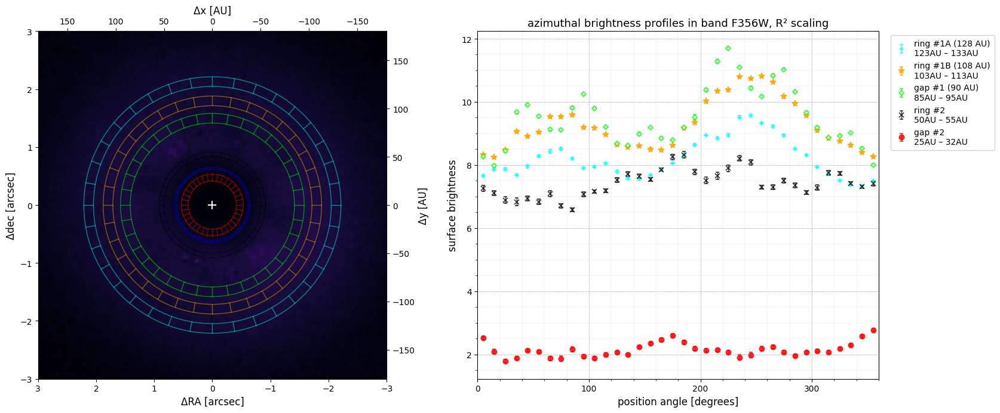

In [34]:
# --- Reproduce Figure 5 from the paper ---

# --- Setup ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8), dpi=100)
plt.subplots_adjust(wspace=0.3)
num_spokes = 36
colors = ['cyan', 'orange', 'lime', 'black', 'blue', 'red']

# --- Left Plot: Image with Overlays ---

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

ax1.imshow(cropped_image*distances**2, origin='lower', cmap='inferno', 
           vmax=100,
           extent=extent)

# Define regions from the right plot's legend in the paper
# Mark the regions we're analyzing with regions_check
markers = ['+', '*', 'D', 'x', '^', 'o']
size = [6, 8, 4, 6, 5, 6]  # Sizes for each marker
regions = {}
for i, (name, (r_in, r_out)) in enumerate(regions_check.items()):
    regions[name] = {
        'range': (r_in, r_out),
        'color': colors[i],
        'marker': markers[i],
        'size': size[i]
    }

# Draw the exact regions being analyzed in the right panel on the left image
# This ensures the overlays match the actual data being plotted
for name, props in regions.items():
    r_inner_au, r_outer_au = props['range']
    r_inner_arcsec = r_inner_au / dist
    r_outer_arcsec = r_outer_au / dist
    color = props['color']
    
    # Draw annulus boundaries for each region
    ring_inner = plt.Circle((0, 0), r_inner_arcsec, fill=False, color=color, 
                           linewidth=1, alpha=0.5, linestyle='-')
    ring_outer = plt.Circle((0, 0), r_outer_arcsec, fill=False, color=color, 
                           linewidth=1, alpha=0.5, linestyle='-')
    ax1.add_patch(ring_inner)
    ax1.add_patch(ring_outer)

    # Draw radial spokes ('spider') to show analysis zone
    for j in range(num_spokes):
        theta_spoke = 2 * np.pi * j / num_spokes
        x_inner = r_inner_arcsec * np.cos(theta_spoke)
        y_inner = r_inner_arcsec * np.sin(theta_spoke)
        x_outer = r_outer_arcsec * np.cos(theta_spoke)
        y_outer = r_outer_arcsec * np.sin(theta_spoke)
        ax1.plot([x_inner, x_outer], [y_inner, y_outer], color=color, linewidth=1, alpha=0.5)

    '''
    # Add a text label for each region
    short_label = name.replace(' (80 AU)', '').replace('in. flank ', '')
    mid_radius = (r_inner_arcsec + r_outer_arcsec) / 2
    angle_label = np.pi / 4  # 45 degrees
    label_x = mid_radius * np.cos(angle_label)
    label_y = mid_radius * np.sin(angle_label)
    ax1.text(label_x, label_y, short_label, color=color, fontsize=8, 
             fontweight='bold', ha='center', va='center',
             bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))
    '''

# Add central star marker with a cross
ax1.plot(0, 0, marker='+', markersize=10, color='white', markeredgewidth=1.5, label='central star')

# Set up axes for the left plot
ax1.set_xlabel('ΔRA [arcsec]', fontsize=12)
ax1.set_ylabel('Δdec [arcsec]', fontsize=12)
ax1.set_xlim(extent[0], extent[1])
ax1.set_ylim(extent[2], extent[3])
ax1.set_aspect('equal', 'box')

# Add secondary axes in AU
secax_x = ax1.secondary_xaxis('top', functions=(lambda x: x * dist, lambda x: x / dist))
secax_x.set_xlabel('Δx [AU]', fontsize=12)
secax_y = ax1.secondary_yaxis('right', functions=(lambda y: y * dist, lambda y: y / dist))
secax_y.set_ylabel('Δy [AU]', fontsize=12)

# --- Right Plot: Azimuthal Brightness Profiles ----
# Create angle array
angles_deg = np.rad2deg(thetas)

# Plot each profile with proper styling
for name, props in list(regions.items()):
    r_inner_au, r_outer_au = props['range']
    
    # Convert AU to pixel radius
    r_inner_pix = (r_inner_au / dist) / pixel_scale
    r_outer_pix = (r_outer_au / dist) / pixel_scale
    
    # Find indices in radii_pix array
    idx_inner = np.argmin(np.abs(radii_pix - r_inner_pix))
    idx_outer = np.argmin(np.abs(radii_pix - r_outer_pix))
    
    if idx_inner >= idx_outer:
        continue

    # Extract annulus data
    annulus_data = polar_image_r2_scaled[:, idx_inner:idx_outer+1]
    
    # Build angular sections based on num_spokes
    angles_edges = np.linspace(0, 2 * np.pi, num_spokes + 1)
    angles_mid = (angles_edges[:-1] + angles_edges[1:]) / 2
    angles_deg_mid = np.rad2deg(angles_mid)

    # Compute section-wise mean and error
    profile = []
    yerr = []
    for j in range(num_spokes):
        # Mask angular slice
        mask_ang = (thetas >= angles_edges[j]) & (thetas < angles_edges[j+1])
        # Extract data for this segment and radial range
        seg_data = annulus_data[mask_ang, :].ravel()
        seg_data = seg_data[~np.isnan(seg_data)]
        if seg_data.size > 0:
            m = np.mean(seg_data)
            e = np.std(seg_data) / np.sqrt(seg_data.size)
        else:
            m, e = np.nan, np.nan
        profile.append(m)
        yerr.append(e)
    profile = np.array(profile)
    yerr = np.array(yerr)

    # Plot with segment-wise error bars
    ax2.errorbar(angles_deg_mid, profile, yerr=yerr,
                 fmt=props['marker'], markersize=props['size'], capsize=2,
                 color=props['color'], ecolor=props['color'], elinewidth=1,
                 markeredgecolor=props['color'],
                 markerfacecolor='white' if props['marker'] in ['D','s','^'] else props['color'],
                 label=f"{name}\n{r_inner_au}AU – {r_outer_au}AU", alpha=0.8,
                 linestyle='None', markeredgewidth=1.2)
    
    # Debug: Print brightness values for comparison
    mean_brightness = np.nanmean(profile)
    print(f"{name} ({r_inner_au}-{r_outer_au} AU): Mean brightness = {mean_brightness:.2e}")
    print(f"  - Radial range in pixels: {idx_inner} to {idx_outer}")
    print(f"  - Radial range in arcsec: {r_inner_arcsec:.3f} to {r_outer_arcsec:.3f}")
    
    # Also check the raw (unscaled) data for comparison
    annulus_data_raw = polar_image[:, idx_inner:idx_outer+1]
    raw_mean = np.nanmean(annulus_data_raw)
    print(f"  - Raw (no R²) mean brightness: {raw_mean:.2e}")
    print("---")

# Set up axes and styling to match the paper
ax2.set_title(f'azimuthal brightness profiles in band {filter_name}, R² scaling', fontsize=13)
ax2.set_xlabel('position angle [degrees]', fontsize=12)
ax2.set_ylabel('surface brightness', fontsize=12)
ax2.set_xlim(0, 360)
ax2.set_xticks([0, 100, 200, 300])
ax2.minorticks_on()
ax2.grid(which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.7)
ax2.grid(which='minor', linestyle=':', linewidth=0.3, color='gray', alpha=0.5)

# Create legend positioned to not overlap with data
legend = ax2.legend(bbox_to_anchor=(1.02, 1), loc='upper left', 
                   fontsize=10, handlelength=1.5, frameon=True, 
                   facecolor='white', framealpha=0.9, borderpad=0.5)

# --- Final Figure Adjustments ---

# Add figure caption
#fig.suptitle(f'Figure 1. Azimuthal intensity profiles in the {filter_name}-band, radially integrated over the gap and ring regions as indicated in the image.\nA distance of {dist:.1f} pc has been assumed.', 
#            fontsize=11, y=0.02, ha='center')

plt.tight_layout(rect=[0, 0.08, 0.85, 0.96])
plt.savefig('azimuthal.png', dpi=300, bbox_inches='tight')
plt.show()


### Deconvolved Image

Data loaded and polar transformation complete.


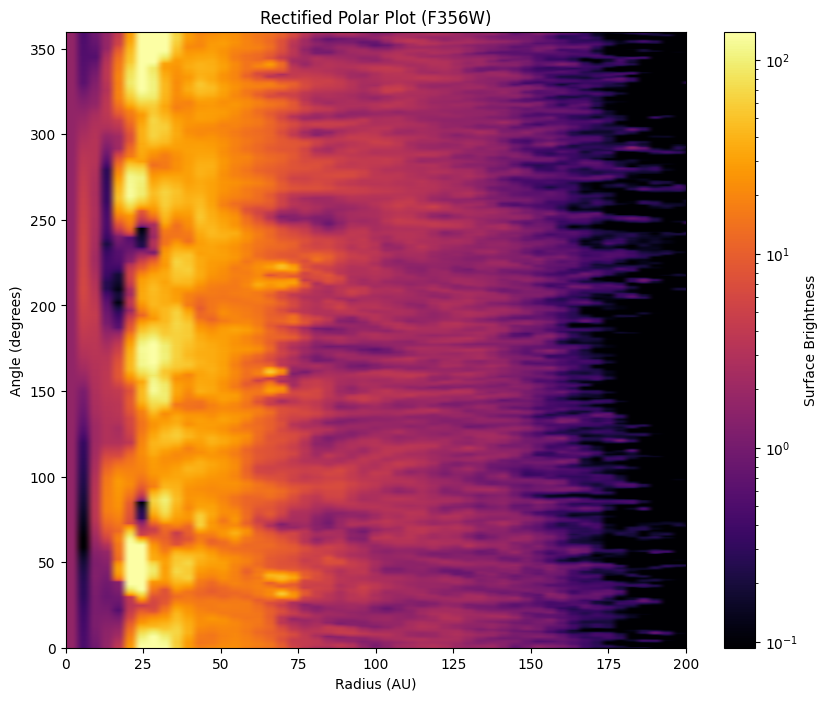

In [35]:
# Rectified Polar Plot
# Read fits file at source/F200W.fits
# Plot the data in a rectified polar plot

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import LogNorm
from scipy.ndimage import map_coordinates

# Load the FITS file
fits_file = 'source/F356W.fits'
hdul = fits.open(fits_file)
data = hdul[0].data
image = data[:,:,0]

# Read header
header = hdul[0].header
# print(header) # You can uncomment this to see the header details
pixel_scale = header['PIXSCALE'] # in arcsec/pixel
dist = 60.1 # distance to TW Hya in pc

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(image, 99.975)

# --- Polar transform ---

# Image dimensions and center
ny, nx = image.shape
center_y, center_x = (ny - 1) / 2.0, (nx - 1) / 2.0

# Define the polar grid
# The radius is the distance from the center to the corner.
max_radius_pix = np.sqrt(center_y**2 + center_x**2)
nr = int(max_radius_pix)
ntheta = 720 # number of angular points

radii_pix = np.linspace(0, max_radius_pix, nr)
thetas = np.linspace(0, 2 * np.pi, ntheta)

# Create a grid of polar coordinates
r_grid, theta_grid = np.meshgrid(radii_pix, thetas)

# Convert polar to Cartesian coordinates
x_cart = r_grid * np.cos(theta_grid + np.pi/2) + center_x
y_cart = r_grid * np.sin(theta_grid + np.pi/2) + center_y

# The coordinates for map_coordinates should be in a (2, N) array
coords = np.array([y_cart.ravel(), x_cart.ravel()])

# Perform the transformation
polar_image = map_coordinates(image, coords, order=1, mode='constant', cval=np.nan).reshape((ntheta, nr))
print("Data loaded and polar transformation complete.")

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# Set x limit to 0 to 200 AU
plt.xlim(0, 200)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name})')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

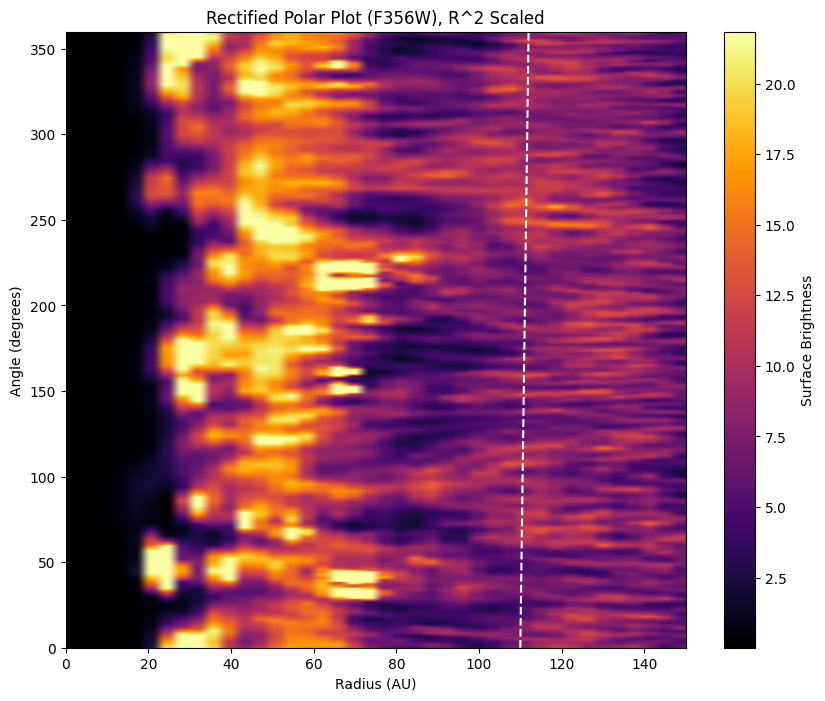

In [36]:
# Apply R^2 scaling to enhance outer features
radii_arcsec = radii_pix * pixel_scale
polar_image_r2_scaled = np.zeros_like(polar_image)
for i in range(polar_image.shape[1]):
    if radii_arcsec[i] > 0:
        polar_image_r2_scaled[:, i] = polar_image[:, i] * (radii_arcsec[i]**2)

# Calculate color limits for this specific image
clim_low_raw, clim_high_raw = np.array([0.001, 1.5]) * np.nanpercentile(polar_image_r2_scaled, 97)

# plot the image
plt.figure(figsize=(10, 8), dpi=100)
plt.imshow(polar_image_r2_scaled, origin='lower', cmap='inferno', 
           vmin=clim_low_raw, vmax=clim_high_raw,
           aspect='auto', extent=[0, max_radius_pix*pixel_scale*dist, 0, 360])

# add a sloped line at 110 AU with slope 2 degrees to the vertical axis
x = np.array([110, 112])
y = np.array([0, 360])
plt.plot(x, y, color='white', linestyle='--', label='Slope = 2 degrees')

# Set x limit to 0 to 200 AU
plt.xlim(0, 150)
plt.colorbar(label='Surface Brightness')
filter_name = fits_file.split('/')[-1].split('.')[0]
plt.title(f'Rectified Polar Plot ({filter_name}), R^2 Scaled')
plt.ylabel('Angle (degrees)')
plt.xlabel('Radius (AU)')
plt.savefig('rectified_polar.png')
plt.show()

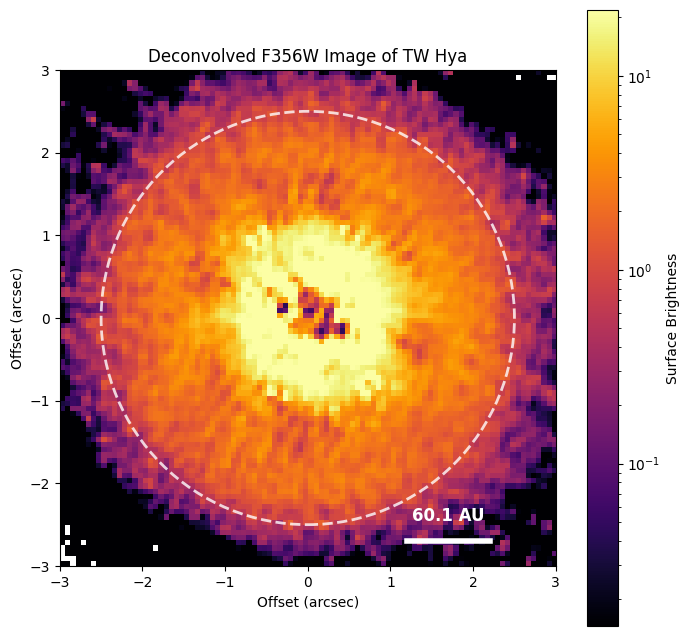

In [37]:
# --- Plot Original Image ---
plt.figure(figsize=(8, 8), dpi=100)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [-half_extent, half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

plt.imshow(cropped_image, origin='lower', cmap='inferno', 
           norm=LogNorm(vmin=clim_low_raw, vmax=clim_high_raw),
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

plt.colorbar(label='Surface Brightness')
plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel('Offset (arcsec)')
plt.ylabel('Offset (arcsec)')

plt.savefig('original_image.png', dpi=300, bbox_inches='tight')
plt.show()


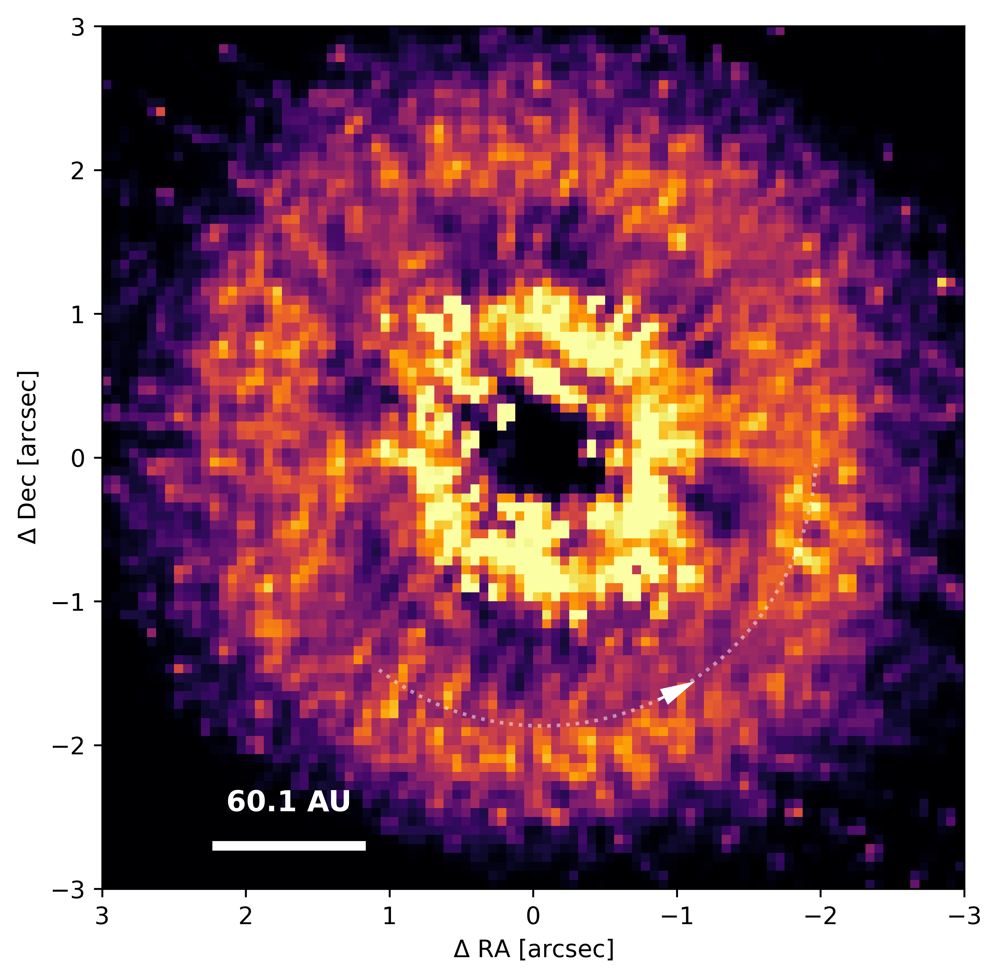

In [38]:
# --- Plot Original Image ---
plt.figure(figsize=(6.5, 6.5), dpi=600)

# Calculate extent in arcseconds centered on the image
extent_arcsec = 6.0  # 5 arcsecond scope
half_extent = extent_arcsec / 2
extent = [half_extent, -half_extent, -half_extent, half_extent]

# Calculate the pixel range corresponding to 5 arcseconds
extent_pixels = extent_arcsec / pixel_scale
half_extent_pix = extent_pixels / 2

# Create a cropped view centered on the image
x_start = int(center_x - half_extent_pix)
x_end = int(center_x + half_extent_pix)
y_start = int(center_y - half_extent_pix)
y_end = int(center_y + half_extent_pix)

# Ensure we don't go outside image bounds
x_start = max(0, x_start)
x_end = min(nx, x_end)
y_start = max(0, y_start)
y_end = min(ny, y_end)

cropped_image = image[y_start:y_end, x_start:x_end]

# distance of each pixel in arcseconds
distances = np.empty_like(cropped_image)
for i in range(cropped_image.shape[0]):
    for j in range(cropped_image.shape[1]):
        # Calculate distance from the center in arcseconds
        distances[i, j] = np.sqrt(((y_start + i) - center_y)**2 + ((x_start + j) - center_x)**2) * pixel_scale

# Normalize the image by maximum value and scale by distance^2
scaled_image = cropped_image * distances**2
normalized_image = scaled_image / np.nanpercentile(scaled_image, 97)
plt.imshow(normalized_image, origin='lower', cmap='inferno',
           vmax=1.0, vmin=0.0,
           extent=extent)

# Add reference circle at 5" radius (actually 2.5" radius since extent goes from -2.5 to +2.5)
#circle = plt.Circle((0, 0), 2.5, fill=False, color='white', linewidth=2, linestyle='--', alpha=0.8)
#plt.gca().add_patch(circle)

# Add 3" scale bar in the bottom right corner
bar_length = 1.0  # 1 arcsecond
bar_x_start = half_extent - 0.8  # Position near right edge
bar_x_end = bar_x_start - bar_length
bar_y = -half_extent + 0.3  # Position near bottom edge

plt.plot([bar_x_end, bar_x_start], [bar_y, bar_y], 'white', linewidth=4)
plt.text(bar_x_start - bar_length/2, bar_y + 0.2, f'{bar_length*dist} AU', color='white', 
         ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add log spiral with a slope of 2 degrees
theta = np.linspace(-0.7 * np.pi, 0, 100)
r_spiral = 1.97* np.exp(np.tan(np.radians(2)) * theta)
x_spiral = r_spiral * np.cos(theta)
y_spiral = r_spiral * np.sin(theta)
plt.plot(-x_spiral, y_spiral, color='white', linestyle=':', label='Log Spiral', alpha=0.5)

# Add a arrow indicating the log spiral direction
plt.arrow( -r_spiral[50]*np.cos(theta[50]), r_spiral[50]*np.sin(theta[50]),
           -0.5*(r_spiral[51]-r_spiral[50])*np.cos(theta[50])-r_spiral[50]*(-np.sin(theta[50])*(theta[51]-theta[50])),
           0.5*(r_spiral[51]-r_spiral[50])*np.sin(theta[50])+r_spiral[50]*(np.cos(theta[50])*(theta[51]-theta[50])),
           head_width=0.1, head_length=0.2, fc='white', ec='white')
           
# Add vertical (to the spiral) lines at the start and end of the spiral
'''
plt.plot([r_spiral[0]*np.cos(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.cos(theta[0]) + 0.1/2**0.5],
         [r_spiral[0]*np.sin(theta[0]) - 0.1/2**0.5, r_spiral[0]*np.sin(theta[0]) + 0.1/2**0.5],
         color='white', linestyle='-', alpha=1)
plt.plot([r_spiral[-1]*np.cos(theta[-1]) + 0.1, r_spiral[-1]*np.cos(theta[-1]) - 0.1],
         [r_spiral[-1]*np.sin(theta[-1]), r_spiral[-1]*np.sin(theta[-1])],
         color='white', linestyle='-')
'''
# Convert extent to AU for secondary labels
extent_au = np.array(extent) * dist  # Convert arcsec to AU

#plt.colorbar(label=r'Normalized Surface Brightness scaled by $distance^2$')
#plt.title(f'Deconvolved {filter_name} Image of TW Hya')

# Set primary axes labels in arcseconds
plt.xlabel(r'$\Delta$ RA [arcsec]')
plt.ylabel(r'$\Delta$ Dec [arcsec]')

plt.savefig('original_image.png', dpi=600, bbox_inches='tight')
plt.show()

Radius 39 au: Max at 49.6 deg, Min at 64.1 deg
Radius 53 au: Max at 241.8 deg, Min at 30.0 deg
Radius 88 au: Max at 228.8 deg, Min at 356.0 deg
Radius 141 au: Max at 245.8 deg, Min at 348.0 deg


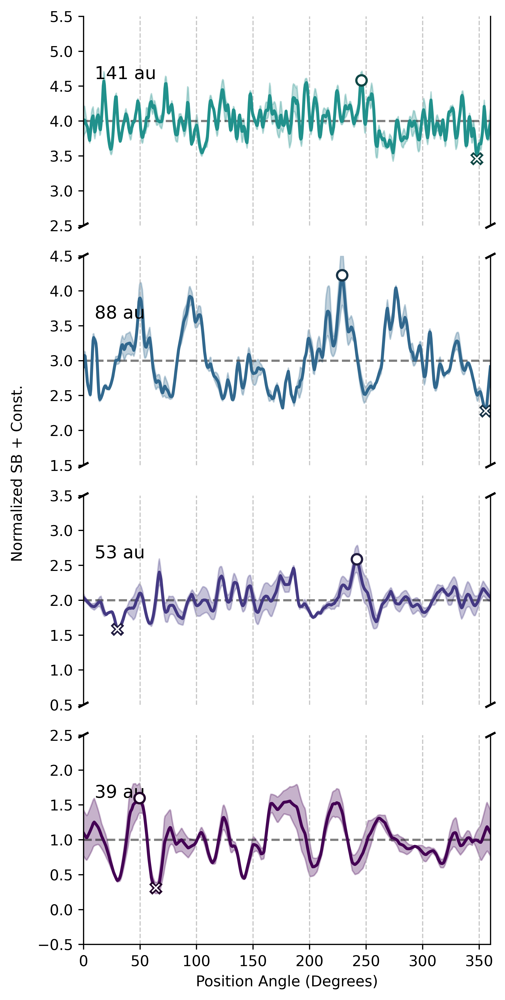

In [39]:
# Define the y-ranges you want to display
y_ranges = [(-0.5, 2.5), (0.5, 3.5), (1.5, 4.5), (2.5, 5.5)]

# Create a figure with one column and a number of rows equal to your ranges
# We use sharex=True so all plots share the same x-axis and ticks
fig, axes = plt.subplots(len(y_ranges), 1, sharex=True, figsize=(5, 10), dpi=600)

# Remove the vertical space between the subplots
fig.subplots_adjust(hspace=0)

# Define the width of the annulus for averaging (in pixels)
annulus_width = 3
annulus_half_width = annulus_width // 2

# Radii of interest in au
radii_au = np.array([39, 53, 88, 141])

# Convert au to pixels
radii_pix_interest = (radii_au / dist) / pixel_scale

# Find the closest index in our radii_pix array
radii_indices = [np.argmin(np.abs(radii_pix - r)) for r in radii_pix_interest]

# Angles in degrees
angles_deg = np.rad2deg(thetas)

# Create a list of colors for the plots
colors = plt.cm.viridis(np.linspace(0, 0.5, len(radii_au)))

# --- Plot each profile on its corresponding subplot ---
# We reverse the axes so that the plot with the smallest y-values is at the bottom
for i, ax in enumerate(axes[::-1]):
    radius_au = radii_au[i]
    radius_idx = radii_indices[i]
    
    # Extract the brightness profile over an annulus
    start_idx = max(0, radius_idx - annulus_half_width)
    end_idx = min(polar_image.shape[1], radius_idx + annulus_half_width + 1)
    
    annulus_data = polar_image[:, start_idx:end_idx]
    
    profile = np.nanmean(annulus_data, axis=1)
    std_dev = np.nanstd(annulus_data, axis=1)
    
    pixel_number = annulus_data.shape[1]
    if pixel_number == 0: continue

    yerr = std_dev / np.sqrt(pixel_number)
    
    profile_mean = np.nanmean(profile)
    if np.isnan(profile_mean) or profile_mean == 0: continue

    # Add offset to separate the plots
    offset = i
    
    normalized_profile = profile / profile_mean + offset
    normalized_yerr = yerr / profile_mean
    
    color = colors[i]
    
    # Set the y-limits for this specific subplot
    ax.set_ylim(y_ranges[i])

    # Add dashed line at the mean level
    ax.axhline(y=offset + 1, linestyle='--', color='black', alpha=0.5)
    
    upper_bound = normalized_profile + normalized_yerr
    lower_bound = normalized_profile - normalized_yerr
    
    ax.fill_between(angles_deg, lower_bound, upper_bound, alpha=0.3, color=color)
    ax.plot(angles_deg, normalized_profile, '-', color=color, linewidth=2)
    
    # Add text annotation for the radius
    # Adjust y-position to be relative to the new ylim
    ax.text(10, y_ranges[i][0] + 0.7 * (y_ranges[i][1] - y_ranges[i][0]), f'{radius_au} au', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.0))
    
    # Mark the maximum and minimum points
    max_idx = np.nanargmax(normalized_profile)
    min_idx = np.nanargmin(normalized_profile)
    darker_color = np.copy(color)
    darker_color[:3] = darker_color[:3] * 0.5  # Darken the color for the marker edge
    ax.plot(angles_deg[max_idx], normalized_profile[max_idx], 'o', color='white', markersize=7, markeredgecolor=darker_color, markeredgewidth=1.5, zorder=5) 
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color=darker_color, markersize=7, markeredgewidth=3)
    ax.plot(angles_deg[min_idx], normalized_profile[min_idx], 'x', color='white', markersize=5, markeredgewidth=1, zorder=5)
    print(f'Radius {radius_au} au: Max at {angles_deg[max_idx]:.1f} deg, Min at {angles_deg[min_idx]:.1f} deg')

    # --- Add break marks and clean up spines ---
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', which='both', bottom=False, top=False) # Hide x-ticks
    
    # Add diagonal break marks to the y-axis spines
    d = .01 # size of the break marks
    kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
    if i < len(axes)-1: # Add marks to the top of all but the top-most plot
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
    if i > 0: # Add marks to the bottom of all but the bottom-most plot
        ax.plot((-d, +d), (-d, +d), **kwargs)
        ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

# --- Final plot adjustments ---
# Only show the bottom spine and label for the last (bottom) plot
axes[-1].spines['bottom'].set_visible(True)
axes[-1].tick_params(axis='x', which='both', bottom=True)
axes[-1].set_xlim(0, 360)
axes[-1].set_xlabel('Position Angle (Degrees)')

# Add a single y-label for the entire figure
fig.text(0.06, 0.5, 'Normalized SB + Const.', va='center', rotation='vertical')

# Optional: Add a title to the entire figure
# fig.suptitle(f'Azimuthal Surface Brightness Distribution with Error Shadow ({filter_name})', y=0.95)

plt.tight_layout(rect=[0.08, 0, 1, 0.95]) # Adjust layout to make space for labels
plt.savefig('azimuthal_distribution_broken_axis.png', dpi=300, bbox_inches='tight')
plt.show()